# Speech Audio Emotion Recognition

## Source Code:

https://www.kaggle.com/code/shivamburnwal/speech-emotion-recognition

(used for data preparation stages and baseline CNN models 1 & 2)


# Imports

In [1]:
import pandas as pd
import numpy as np
import os
import os.path
import sys
import matplotlib.pyplot as plt
import seaborn as sns
import librosa
import librosa.display
from IPython.display import Audio

from tqdm import tqdm

from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

from IPython.display import Image
import keras
from keras.callbacks import ReduceLROnPlateau
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Dropout, Activation, Flatten
from keras.layers import Conv1D, MaxPooling1D, Conv2D, MaxPooling2D, AveragePooling2D
from keras.layers import LSTM, BatchNormalization, TimeDistributed, GRU
from keras.layers import SimpleRNN
from keras.layers import Layer
from keras.optimizers import Adam, SGD
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import backend as K
from keras.utils import to_categorical
from keras.utils import plot_model

# Data Preparation

## Loading the Data

In [5]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


Ravdess dataset: https://www.kaggle.com/datasets/uwrfkaggler/ravdess-emotional-speech-audio

In [6]:
Ravdess = '/content/drive/MyDrive/DS340Project/RAVDESS/'

#os.getcwd()            # Check current directory
os.chdir(Ravdess)       # Access new directory
#os.listdir(Ravdess)    # List current directory contents

ravdess_directory_list = os.listdir(Ravdess)

file_emotion = []
file_path = []
for dir in ravdess_directory_list:
    # as their are 20 different actors in our previous directory we need to extract files for each actor.
    actor = os.listdir(Ravdess + dir)
    for file in actor:
        part = file.split('.')[0]
        part = part.split('-')
        # third part in each file represents the emotion associated to that file.
        file_emotion.append(int(part[2]))
        file_path.append(Ravdess + dir + '/' + file)

# dataframe for emotion of files
emotion_df = pd.DataFrame(file_emotion, columns=['Emotions'])

# dataframe for path of files.
path_df = pd.DataFrame(file_path, columns=['Path'])
Ravdess_df = pd.concat([emotion_df, path_df], axis=1)

# changing integers to actual emotions.
Ravdess_df.Emotions.replace({1:'neutral', 2:'calm', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust', 8:'surprise'}, inplace=True)
Ravdess_df

,Emotions,Path
0,neutral,/content/drive/MyDrive/DS340Project/RAVDESS/Ac...
1,happy,/content/drive/MyDrive/DS340Project/RAVDESS/Ac...
2,calm,/content/drive/MyDrive/DS340Project/RAVDESS/Ac...
3,angry,/content/drive/MyDrive/DS340Project/RAVDESS/Ac...
4,calm,/content/drive/MyDrive/DS340Project/RAVDESS/Ac...
...,...,...
1435,surprise,/content/drive/MyDrive/DS340Project/RAVDESS/Ac...
1436,surprise,/content/drive/MyDrive/DS340Project/RAVDESS/Ac...
1437,surprise,/content/drive/MyDrive/DS340Project/RAVDESS/Ac...
1438,sad,/content/drive/MyDrive/DS340Project/RAVDESS/Ac...


Savee dataset: https://www.kaggle.com/datasets/ejlok1/surrey-audiovisual-expressed-emotion-savee

In [7]:
Savee = '/content/drive/MyDrive/DS340Project/SAVEE/'

#os.getcwd()            # Check current directory
os.chdir(Savee)       # Access new directory
#os.listdir(Ravdess)    # List current directory contents

savee_directory_list = os.listdir(Savee)

file_emotion = []
file_path = []

for file in savee_directory_list:
    file_path.append(Savee + file)
    part = file.split('_')[1]
    ele = part[:-6]
    if ele=='a':
        file_emotion.append('angry')
    elif ele=='d':
        file_emotion.append('disgust')
    elif ele=='f':
        file_emotion.append('fear')
    elif ele=='h':
        file_emotion.append('happy')
    elif ele=='n':
        file_emotion.append('neutral')
    elif ele=='sa':
        file_emotion.append('sad')
    else:
        file_emotion.append('surprise')

# dataframe for emotion of files
emotion_df = pd.DataFrame(file_emotion, columns=['Emotions'])

# dataframe for path of files.
path_df = pd.DataFrame(file_path, columns=['Path'])
Savee_df = pd.concat([emotion_df, path_df], axis=1)
Savee_df

,Emotions,Path
0,angry,/content/drive/MyDrive/DS340Project/SAVEE/DC_a...
1,angry,/content/drive/MyDrive/DS340Project/SAVEE/DC_a...
2,angry,/content/drive/MyDrive/DS340Project/SAVEE/DC_a...
3,angry,/content/drive/MyDrive/DS340Project/SAVEE/DC_a...
4,angry,/content/drive/MyDrive/DS340Project/SAVEE/DC_a...
...,...,...
475,sad,/content/drive/MyDrive/DS340Project/SAVEE/KL_s...
476,surprise,/content/drive/MyDrive/DS340Project/SAVEE/KL_s...
477,sad,/content/drive/MyDrive/DS340Project/SAVEE/KL_s...
478,surprise,/content/drive/MyDrive/DS340Project/SAVEE/KL_s...


In [8]:
df = pd.concat([Ravdess_df, Savee_df], ignore_index = True)
df

,Emotions,Path
0,neutral,/content/drive/MyDrive/DS340Project/RAVDESS/Ac...
1,happy,/content/drive/MyDrive/DS340Project/RAVDESS/Ac...
2,calm,/content/drive/MyDrive/DS340Project/RAVDESS/Ac...
3,angry,/content/drive/MyDrive/DS340Project/RAVDESS/Ac...
4,calm,/content/drive/MyDrive/DS340Project/RAVDESS/Ac...
...,...,...
1915,sad,/content/drive/MyDrive/DS340Project/SAVEE/KL_s...
1916,surprise,/content/drive/MyDrive/DS340Project/SAVEE/KL_s...
1917,sad,/content/drive/MyDrive/DS340Project/SAVEE/KL_s...
1918,surprise,/content/drive/MyDrive/DS340Project/SAVEE/KL_s...


## Visualizations of the Emotion Classes

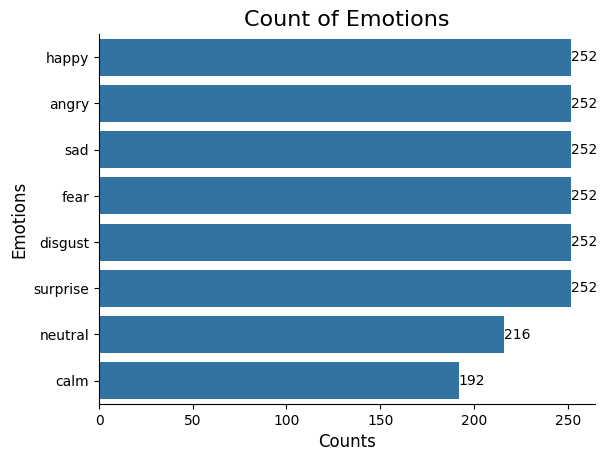

In [90]:
ax = sns.countplot(df.Emotions, order=df.Emotions.value_counts(ascending=False).index)
ax.bar_label(container=ax.containers[0], labels=df.Emotions.value_counts(ascending=False).values)
plt.title('Count of Emotions', size=16)
plt.ylabel('Emotions', size=12)
plt.xlabel('Counts', size=12)
sns.despine(top=True, right=True, left=False, bottom=False)
plt.show()

In [10]:
def create_waveplot(data, sr, e):
    plt.figure(figsize=(10, 3))
    plt.title('Waveplot for audio with {} emotion'.format(e), size=15)
    librosa.display.waveshow(data, sr=sr)
    plt.show()

def create_spectrogram(data, sr, e):
    # stft function converts the data into short term fourier transform
    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(12, 3))
    plt.title('Spectrogram for audio with {} emotion'.format(e), size=15)
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
    #librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar()

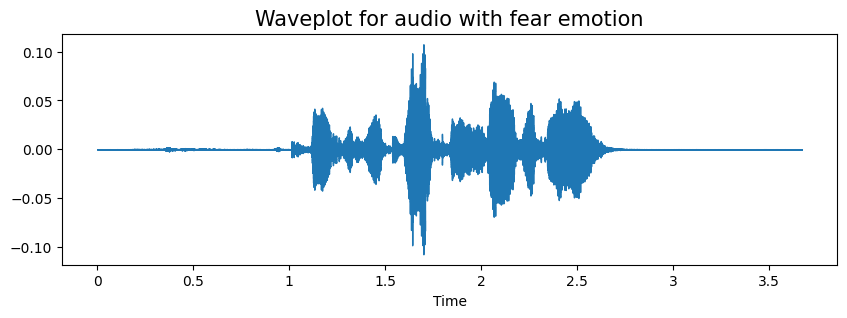

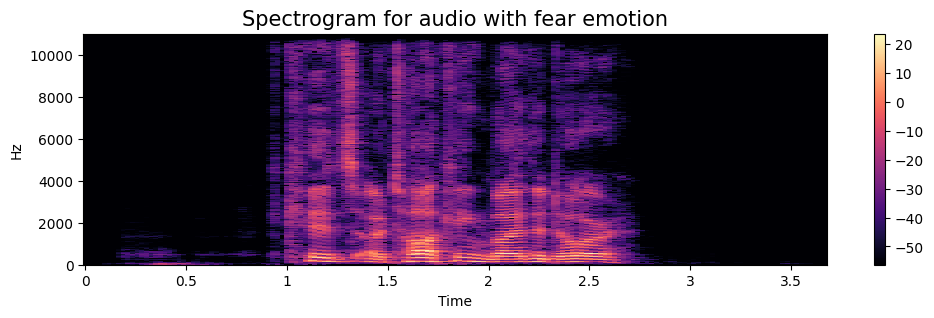

In [189]:
emotion = 'fear'
path = np.array(df.Path[df.Emotions==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

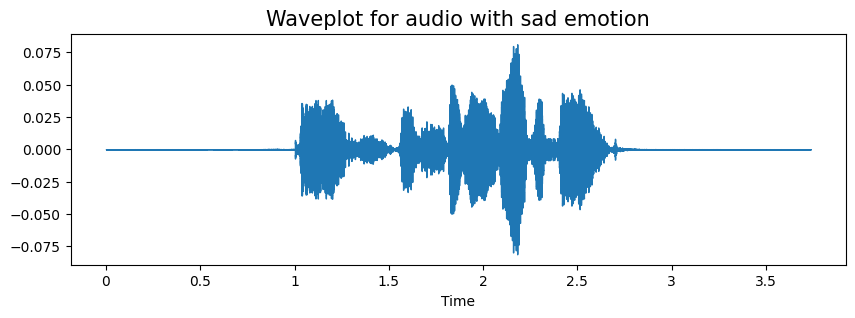

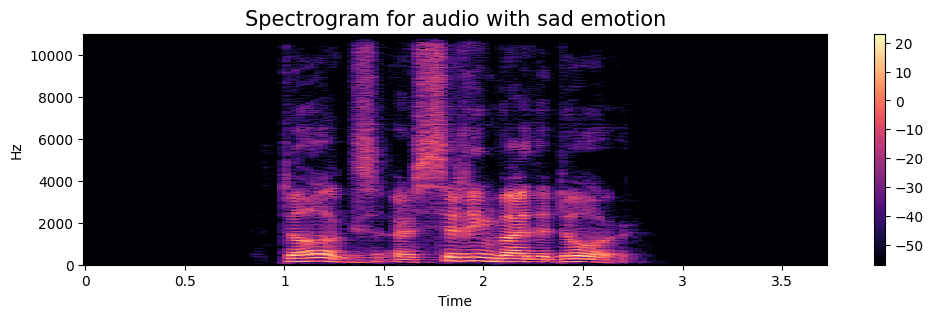

In [190]:
emotion = 'sad'
path = np.array(df.Path[df.Emotions==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

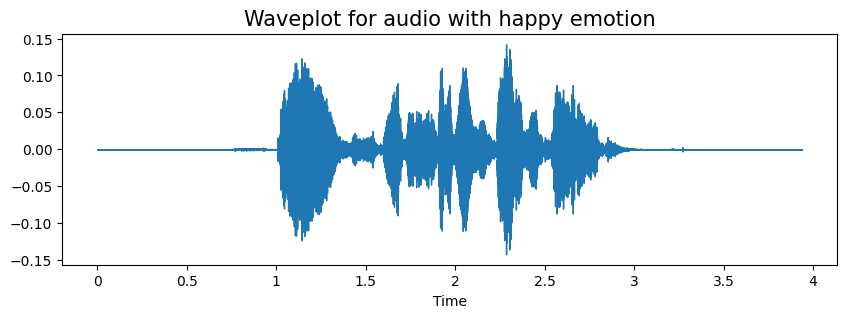

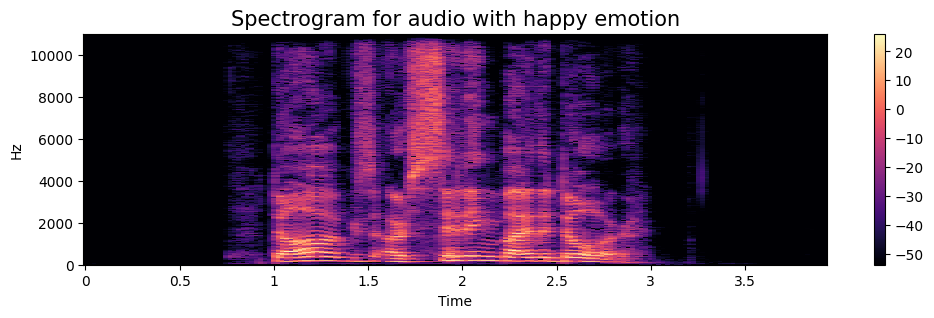

In [191]:
emotion = 'happy'
path = np.array(df.Path[df.Emotions==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

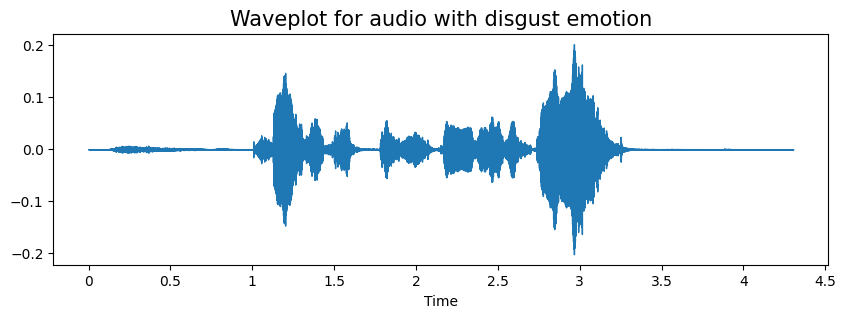

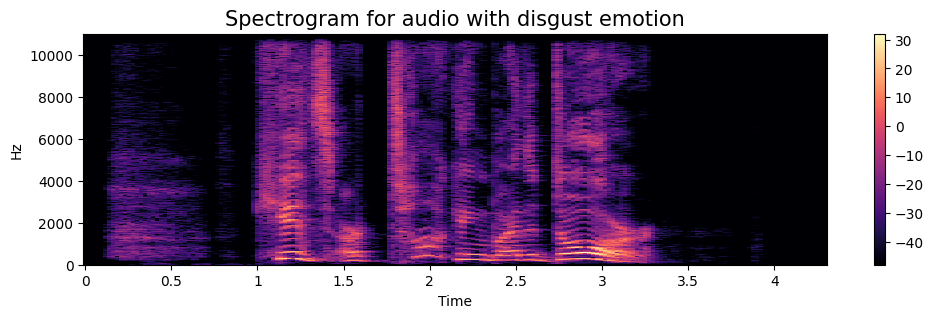

In [192]:
emotion = 'disgust'
path = np.array(df.Path[df.Emotions==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

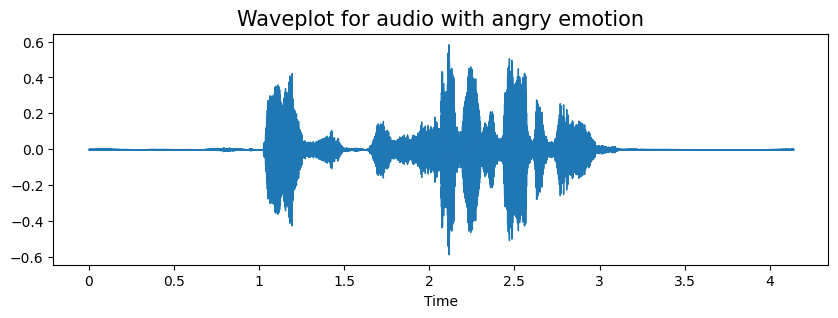

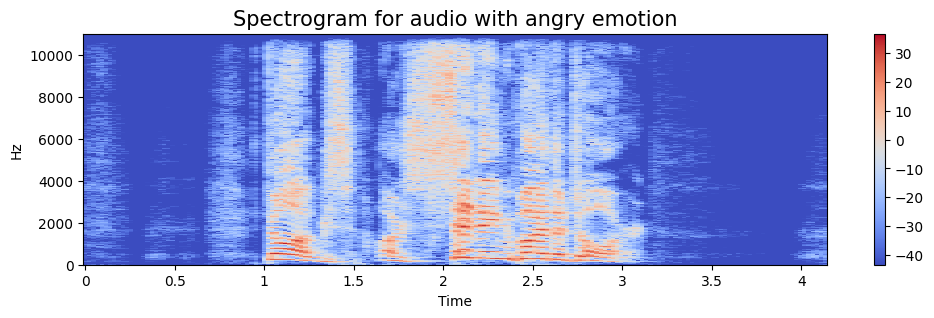

In [11]:
emotion = 'angry'
path = np.array(df.Path[df.Emotions==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

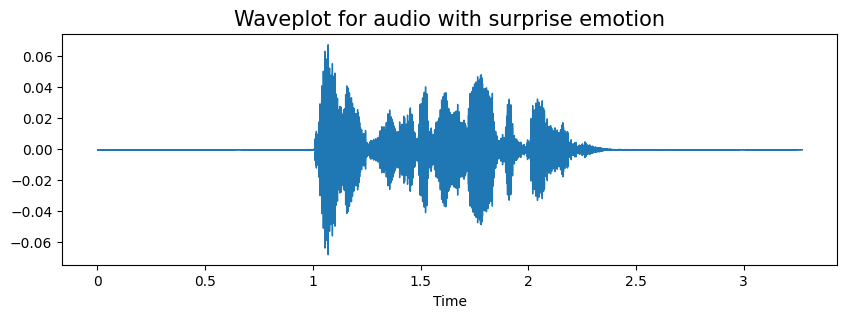

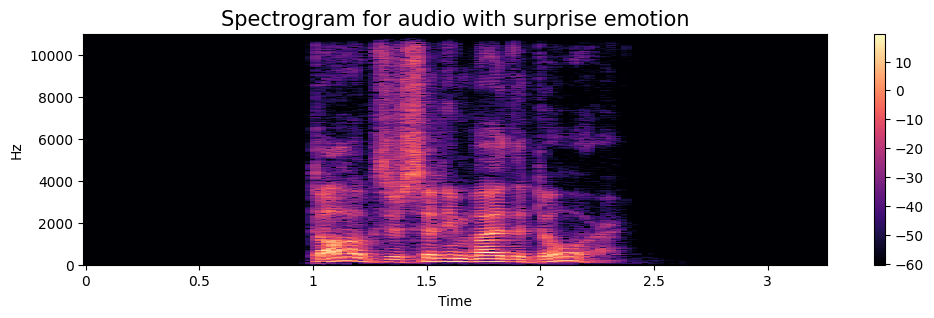

In [194]:
emotion = 'surprise'
path = np.array(df.Path[df.Emotions==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

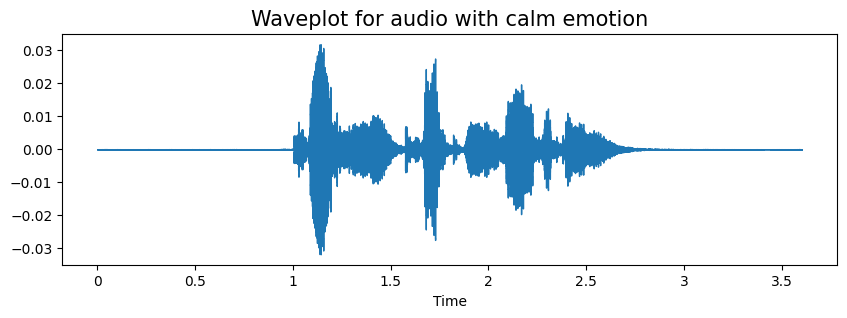

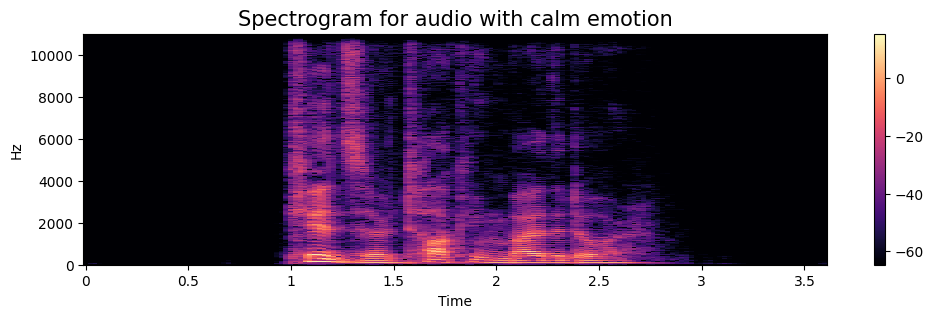

In [195]:
emotion = 'calm'
path = np.array(df.Path[df.Emotions==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

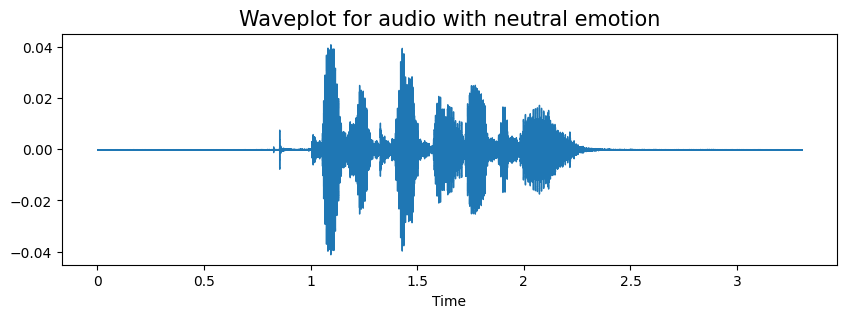

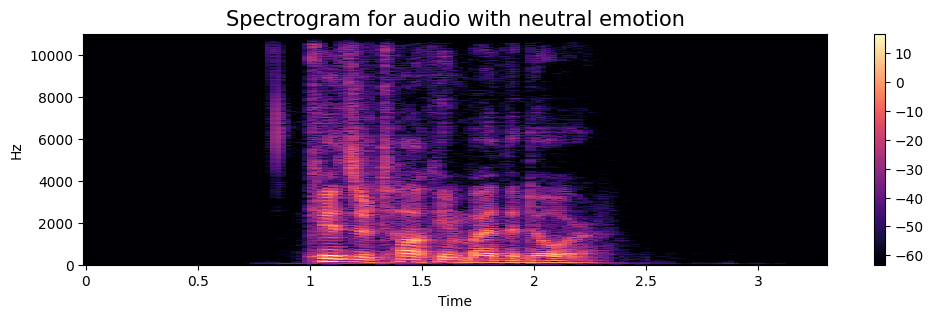

In [196]:
emotion = 'neutral'
path = np.array(df.Path[df.Emotions==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

## Data Augmentation Functions

In [41]:
def noise(data):
    noise_amp = 0.035*np.random.uniform()*np.amax(data)
    data = data + noise_amp*np.random.normal(size=data.shape[0])
    return data

def stretch(data):
    return librosa.effects.time_stretch(data, rate=.8)

def shift(data):
    shift_range = int(np.random.uniform(low=-5, high = 5)*1000)
    return np.roll(data, shift_range)

def pitch(data,sample_rate):
    return librosa.effects.pitch_shift(data, sr=sample_rate, n_steps=7)

In [ ]:
# taking any example and checking for techniques.
path = np.array(df.Path)[1]
data, sample_rate = librosa.load(path)

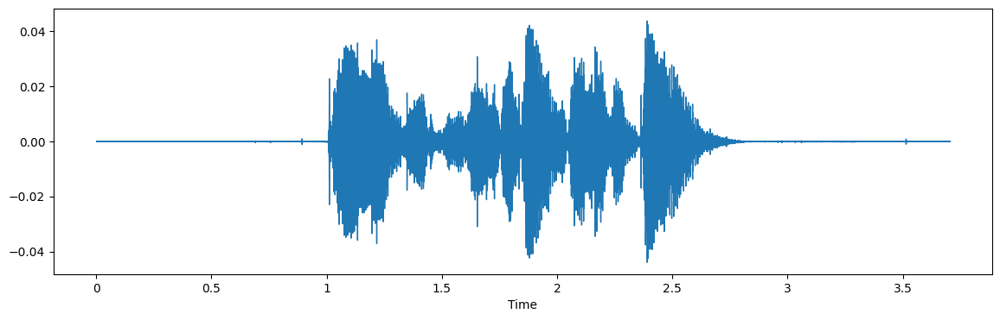

In [ ]:
# Simple Audio
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=data, sr=sample_rate)
Audio(path)

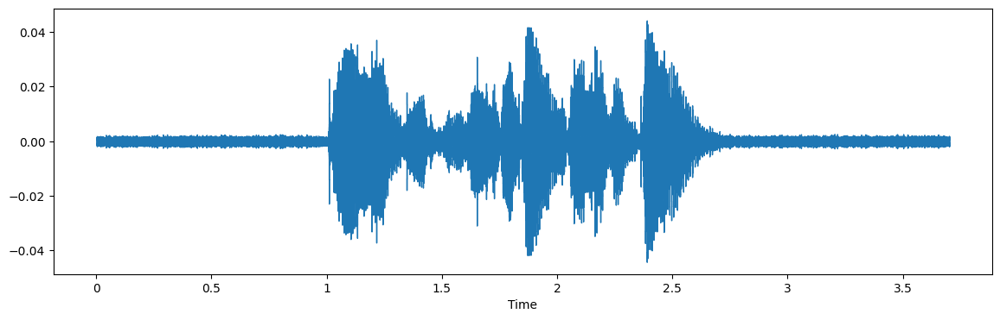

In [ ]:
# Noise Injection
x = noise(data)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
Audio(x, rate=sample_rate)

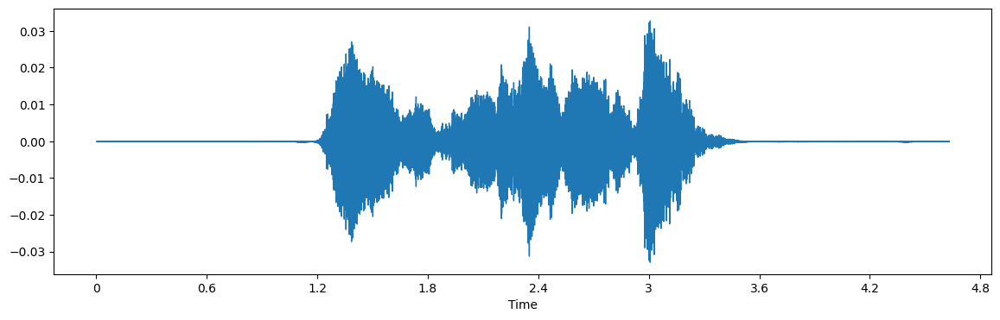

In [ ]:
# Stretching
x = stretch(data)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
Audio(x, rate=sample_rate)

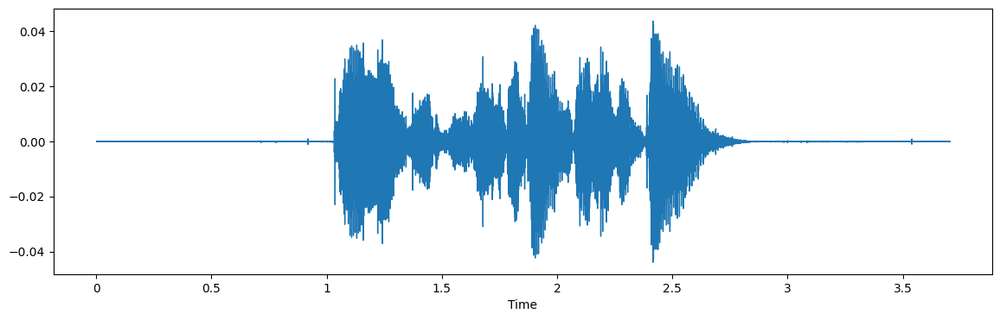

In [ ]:
# Shifting
x = shift(data)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
Audio(x, rate=sample_rate)

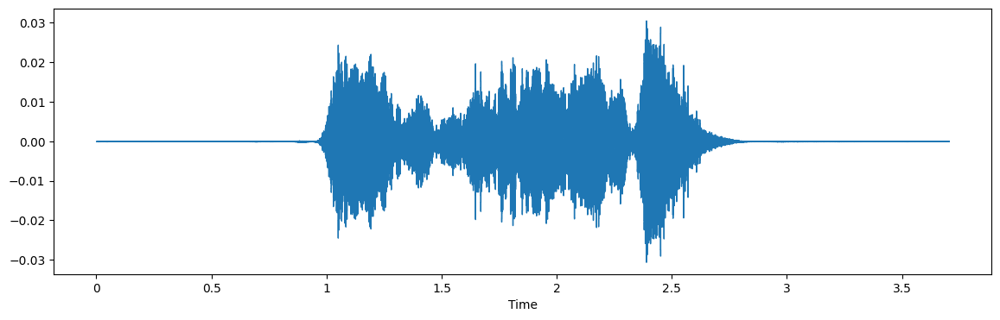

In [ ]:
# Pitch
x = pitch(data)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
Audio(x, rate=sample_rate)

## Feature Extraction from Augmented Data


In [39]:
def extract_features(data,sample_rate):
    # Zero Crossing Rate
    result = np.array([])
    zcr = np.mean(librosa.feature.zero_crossing_rate(y=data).T, axis=0)
    result=np.hstack((result, zcr)) # stacking horizontally

    # Chroma_stft
    stft = np.abs(librosa.stft(data))
    chroma_stft = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T, axis=0)
    result = np.hstack((result, chroma_stft)) # stacking horizontally

    # MFCC
    mfcc = np.mean(librosa.feature.mfcc(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mfcc)) # stacking horizontally

    # Root Mean Square Value
    rms = np.mean(librosa.feature.rms(y=data).T, axis=0)
    result = np.hstack((result, rms)) # stacking horizontally

    # MelSpectogram
    mel = np.mean(librosa.feature.melspectrogram(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mel)) # stacking horizontally

    return result

In [40]:
def get_features(path):
    # duration and offset are used to take care of the no audio in start and the ending of each audio files as seen above.
    data, sample_rate = librosa.load(path, duration=2.5, offset=0.6)

    # without augmentation
    res1 = extract_features(data,sample_rate)
    result = np.array(res1)

    # data with noise
    noise_data = noise(data)
    res2 = extract_features(noise_data,sample_rate)
    result = np.vstack((result, res2)) # stacking vertically

    # data with stretching
    stretch_data = stretch(data)
    res3 = extract_features(stretch_data,sample_rate)
    result = np.vstack((result, res3)) # stacking vertically

    # data with pitching
    pitch_data = pitch(data, sample_rate)
    res4 = extract_features(pitch_data,sample_rate)
    result = np.vstack((result, res4)) # stacking vertically

    return result

In [ ]:
X, Y = [], []
for path, emotion in tqdm(zip(df.Path, df.Emotions), total=len(df.Path)):
    feature = get_features(path)
    for ele in feature:
        X.append(ele)
        # appending emotion 4 times as we have made 4 augmentation techniques on each audio file.
        Y.append(emotion)

len(X), len(Y), df.Path.shape

100%|██████████| 1920/1920 [16:00<00:00,  2.00it/s]


(7680, 7680, (1920,))

In [ ]:
Features = pd.DataFrame(X)
Features['labels'] = Y
Features.to_csv('/content/drive/MyDrive/DS340Project/features.csv', index=False)
Features

,0,1,2,3,4,5,6,7,8,9,...,153,154,155,156,157,158,159,160,161,labels
0,0.293566,0.673896,0.722096,0.723508,0.682302,0.680533,0.675352,0.628977,0.679179,0.707283,...,6.984505e-06,7.034950e-06,6.654923e-06,6.979548e-06,1.214236e-05,9.640183e-06,1.096403e-05,5.543237e-06,4.254084e-07,neutral
1,0.318283,0.767527,0.817022,0.799512,0.785292,0.794199,0.746606,0.651910,0.686053,0.726052,...,9.014994e-05,8.813220e-05,8.358031e-05,8.959403e-05,9.375046e-05,9.444011e-05,9.445891e-05,8.785902e-05,8.004236e-05,neutral
2,0.168298,0.694371,0.727215,0.688030,0.664346,0.675902,0.634768,0.637774,0.691974,0.722612,...,2.797620e-06,3.027207e-06,3.510560e-06,3.349115e-06,5.726472e-06,4.637588e-06,5.238408e-06,2.391436e-06,1.455581e-07,neutral
3,0.192044,0.675267,0.634700,0.681160,0.702156,0.731349,0.665670,0.640723,0.608663,0.655598,...,1.595107e-05,1.223287e-05,7.110164e-06,7.660465e-06,3.098759e-06,1.970621e-06,2.038793e-06,7.761399e-07,5.283976e-08,neutral
4,0.259879,0.621764,0.669827,0.692539,0.652645,0.571166,0.595168,0.586239,0.608535,0.637656,...,6.779312e-05,4.632183e-05,5.351165e-05,5.744937e-05,5.894652e-05,5.425128e-05,5.536501e-05,2.759516e-05,2.388180e-06,happy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7675,0.044122,0.623267,0.535362,0.461837,0.397403,0.391412,0.420586,0.424648,0.491122,0.485390,...,3.783897e-06,1.701214e-06,2.575379e-06,1.848751e-06,1.014382e-06,6.776811e-07,1.140086e-06,3.763282e-07,3.924005e-08,surprise
7676,0.019934,0.604011,0.543243,0.477521,0.442807,0.412928,0.421630,0.510570,0.592495,0.525786,...,5.620557e-08,4.005692e-08,3.565935e-08,3.383525e-08,3.466478e-08,3.474812e-08,3.548512e-08,3.250027e-08,2.158683e-08,sad
7677,0.026869,0.655998,0.600688,0.556933,0.535229,0.510727,0.506117,0.585986,0.637554,0.555004,...,7.373139e-06,7.304736e-06,7.839320e-06,7.882545e-06,8.481871e-06,8.216773e-06,8.549629e-06,8.074714e-06,8.127908e-06,sad
7678,0.018866,0.609005,0.489882,0.448491,0.405052,0.386361,0.426509,0.534410,0.545462,0.463379,...,2.918701e-08,2.486708e-08,2.320417e-08,2.637818e-08,1.945933e-08,1.749393e-08,1.796221e-08,1.435606e-08,9.387995e-09,sad


# Splitting and resizing

In [2]:
from google.colab import drive
drive.mount('/content/drive/')
Features = pd.read_csv('/content/drive/MyDrive/DS340Project/features.csv', index_col=0)
Features.head()

Mounted at /content/drive/


,1,2,3,4,5,6,7,8,9,10,...,153,154,155,156,157,158,159,160,161,labels
0,,,,,,,,,,,,,,,,,,,,,
0.293566,0.673896,0.722096,0.723508,0.682302,0.680533,0.675352,0.628977,0.679179,0.707283,0.734498,...,0.000007,0.000007,0.000007,0.000007,0.000012,0.000010,0.000011,5.543237e-06,4.254084e-07,neutral
0.318283,0.767527,0.817022,0.799512,0.785292,0.794199,0.746606,0.651910,0.686053,0.726052,0.780630,...,0.000090,0.000088,0.000084,0.000090,0.000094,0.000094,0.000094,8.785902e-05,8.004236e-05,neutral
0.168298,0.694371,0.727215,0.688030,0.664346,0.675902,0.634768,0.637774,0.691974,0.722612,0.722058,...,0.000003,0.000003,0.000004,0.000003,0.000006,0.000005,0.000005,2.391436e-06,1.455581e-07,neutral
0.192044,0.675267,0.634700,0.681160,0.702156,0.731349,0.665670,0.640723,0.608663,0.655598,0.652824,...,0.000016,0.000012,0.000007,0.000008,0.000003,0.000002,0.000002,7.761399e-07,5.283976e-08,neutral
0.259879,0.621764,0.669827,0.692539,0.652645,0.571166,0.595168,0.586239,0.608535,0.637656,0.626472,...,0.000068,0.000046,0.000054,0.000057,0.000059,0.000054,0.000055,2.759516e-05,2.388180e-06,happy


In [3]:
X = Features.iloc[: ,:-1].values
Y = Features['labels'].values

print(X.shape, Y.shape)
X,Y

(7680, 161) (7680,)


(array([[6.73896372e-01, 7.22095788e-01, 7.23507702e-01, ...,
         1.09640305e-05, 5.54323742e-06, 4.25408444e-07],
        [7.67526881e-01, 8.17022395e-01, 7.99511501e-01, ...,
         9.44589101e-05, 8.78590213e-05, 8.00423586e-05],
        [6.94371045e-01, 7.27215171e-01, 6.88030005e-01, ...,
         5.23840754e-06, 2.39143628e-06, 1.45558133e-07],
        ...,
        [6.55997548e-01, 6.00687707e-01, 5.56932519e-01, ...,
         8.54962867e-06, 8.07471433e-06, 8.12790755e-06],
        [6.09005332e-01, 4.89882290e-01, 4.48490918e-01, ...,
         1.79622113e-08, 1.43560568e-08, 9.38799527e-09],
        [3.67735893e-01, 4.64679182e-01, 5.36989748e-01, ...,
         1.47835351e-06, 1.02349100e-06, 4.39847874e-08]]),
 array(['neutral', 'neutral', 'neutral', ..., 'sad', 'sad', 'sad'],
       dtype=object))

In [4]:
# As this is a multiclass classification problem onehotencoding our Y.
encoder = OneHotEncoder()
Y = encoder.fit_transform(np.array(Y).reshape(-1,1)).toarray()
print(X.shape, Y.shape)

(7680, 161) (7680, 8)


In [5]:
# splitting data
x_train, x_test, y_train, y_test = train_test_split(X, Y, random_state=0, shuffle=True)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((5760, 161), (5760, 8), (1920, 161), (1920, 8))

In [6]:
# scaling our data with sklearn's Standard scaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)
x_train.shape, y_train.shape, x_test.shape, y_test.shape
#x_train, y_train, x_test, y_test

((5760, 161), (5760, 8), (1920, 161), (1920, 8))

In [7]:
# making our data compatible to model.
x_train = np.expand_dims(x_train, axis=2)
x_test = np.expand_dims(x_test, axis=2)
x_train.shape, y_train.shape, x_test.shape, y_test.shape
#x_train, y_train, x_test, y_test

((5760, 161, 1), (5760, 8), (1920, 161, 1), (1920, 8))

# Modeling

## Model Evaluation Functions

In [8]:
# Accuracy Plot
def accuracy_plot(model, history, x_test, y_test):
  print("Accuracy of our model on test data : " , model.evaluate(x_test,y_test)[1]*100 , "%")

  epochs = [i for i in range(50)]
  fig , ax = plt.subplots(1,2)
  train_acc = history.history['accuracy']
  train_loss = history.history['loss']
  test_acc = history.history['val_accuracy']
  test_loss = history.history['val_loss']

  fig.set_size_inches(20,6)
  ax[0].plot(epochs , train_loss , label = 'Training Loss')
  ax[0].plot(epochs , test_loss , label = 'Testing Loss')
  ax[0].set_title('Training & Testing Loss')
  ax[0].legend()
  ax[0].set_xlabel("Epochs")

  ax[1].plot(epochs , train_acc , label = 'Training Accuracy')
  ax[1].plot(epochs , test_acc , label = 'Testing Accuracy')
  ax[1].set_title('Training & Testing Accuracy')
  ax[1].legend()
  ax[1].set_xlabel("Epochs")
  plt.show()

# Predicting on Test Data
def predicting(model, x_test, y_test):

  # Making New Predictions
  pred_test = model.predict(x_test)
  y_pred = encoder.inverse_transform(pred_test)
  y_test = encoder.inverse_transform(y_test)

  df = pd.DataFrame(columns=['Predicted Labels', 'Actual Labels'])
  df['Predicted Labels'] = y_pred.flatten()
  df['Actual Labels'] = y_test.flatten()
  print(df)

  # Confusion Matrix
  cm = confusion_matrix(y_test, y_pred)
  plt.figure(figsize = (12, 10))
  cm = pd.DataFrame(cm , index = [i for i in encoder.categories_] , columns = [i for i in encoder.categories_])
  sns.heatmap(cm, linecolor='white', cmap='Blues', linewidth=1, annot=True, fmt='')
  plt.title('Confusion Matrix', size=20)
  plt.xlabel('Predicted Labels', size=14)
  plt.ylabel('Actual Labels', size=14)
  plt.show()

  # Classification Report
  print("\nClassification_report:", classification_report(y_test, y_pred))

## CNN w/ 1 hidden layer - Accuracy: 62.76%

In [ ]:
cnn1_model = Sequential()
cnn1_model.add(Conv1D(128, 5, padding='same', input_shape=(x_train.shape[1], 1)))
cnn1_model.add(Activation('relu'))
cnn1_model.add(Dropout(0.2))
cnn1_model.add(Flatten())
cnn1_model.add(Dense(8))
cnn1_model.add(Activation('softmax'))
cnn1_model.compile(optimizer = 'adam' , loss = 'categorical_crossentropy' , metrics = ['accuracy'])

print(cnn1_model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 161, 128)          768       
                                                                 
 activation_2 (Activation)   (None, 161, 128)          0         
                                                                 
 dropout_1 (Dropout)         (None, 161, 128)          0         
                                                                 
 flatten_1 (Flatten)         (None, 20608)             0         
                                                                 
 dense_1 (Dense)             (None, 8)                 164872    
                                                                 
 activation_3 (Activation)   (None, 8)                 0         
                                                                 
Total params: 165640 (647.03 KB)
Trainable params: 165

In [ ]:
rlrp = ReduceLROnPlateau(monitor='loss', factor=0.4, verbose=0, patience=2, min_lr=0.0000001)

cnn1_history=cnn1_model.fit(x_train, y_train, batch_size=64, epochs=50, validation_data=(x_test, y_test), callbacks=[rlrp])

Epoch 1/50
90/90 [==============================] - 4s 36ms/step - loss: 1.7099 - accuracy: 0.3564 - val_loss: 1.5950 - val_accuracy: 0.4062 - lr: 0.0010
Epoch 2/50
90/90 [==============================] - 4s 42ms/step - loss: 1.4382 - accuracy: 0.4679 - val_loss: 1.5117 - val_accuracy: 0.4422 - lr: 0.0010
Epoch 3/50
90/90 [==============================] - 3s 33ms/step - loss: 1.3267 - accuracy: 0.5082 - val_loss: 1.4790 - val_accuracy: 0.4599 - lr: 0.0010
Epoch 4/50
90/90 [==============================] - 2s 27ms/step - loss: 1.2522 - accuracy: 0.5347 - val_loss: 1.4237 - val_accuracy: 0.5073 - lr: 0.0010
Epoch 5/50
90/90 [==============================] - 3s 30ms/step - loss: 1.1922 - accuracy: 0.5538 - val_loss: 1.3914 - val_accuracy: 0.5193 - lr: 0.0010
Epoch 6/50
90/90 [==============================] - 2s 28ms/step - loss: 1.1425 - accuracy: 0.5825 - val_loss: 1.3704 - val_accuracy: 0.5193 - lr: 0.0010
Epoch 7/50
90/90 [==============================] - 4s 48ms/step - loss: 1.1

60/60 [==============================] - 0s 5ms/step - loss: 1.3767 - accuracy: 0.6276
Accuracy of our model on test data :  62.76041865348816 %


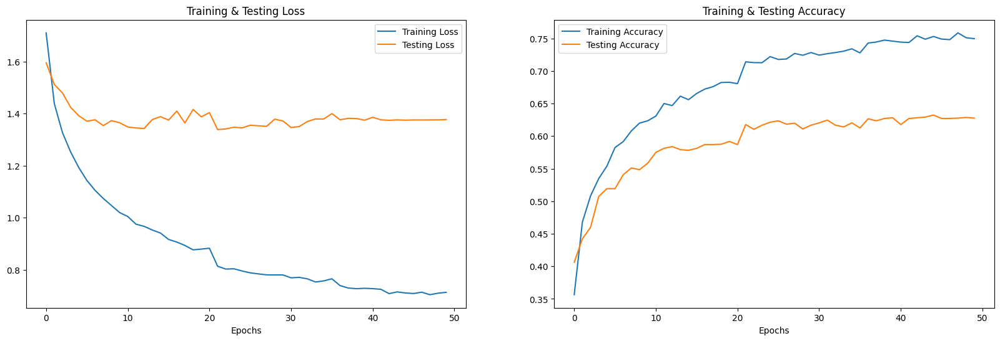

In [ ]:
accuracy_plot(cnn1_model, cnn1_history, x_test, y_test)

60/60 [==============================] - 0s 6ms/step
     Predicted Labels Actual Labels
0               angry         angry
1                 sad           sad
2                calm          calm
3               happy         happy
4                fear          fear
...               ...           ...
1915          disgust          calm
1916          disgust       disgust
1917          disgust       neutral
1918             calm          calm
1919            angry           sad

[1920 rows x 2 columns]


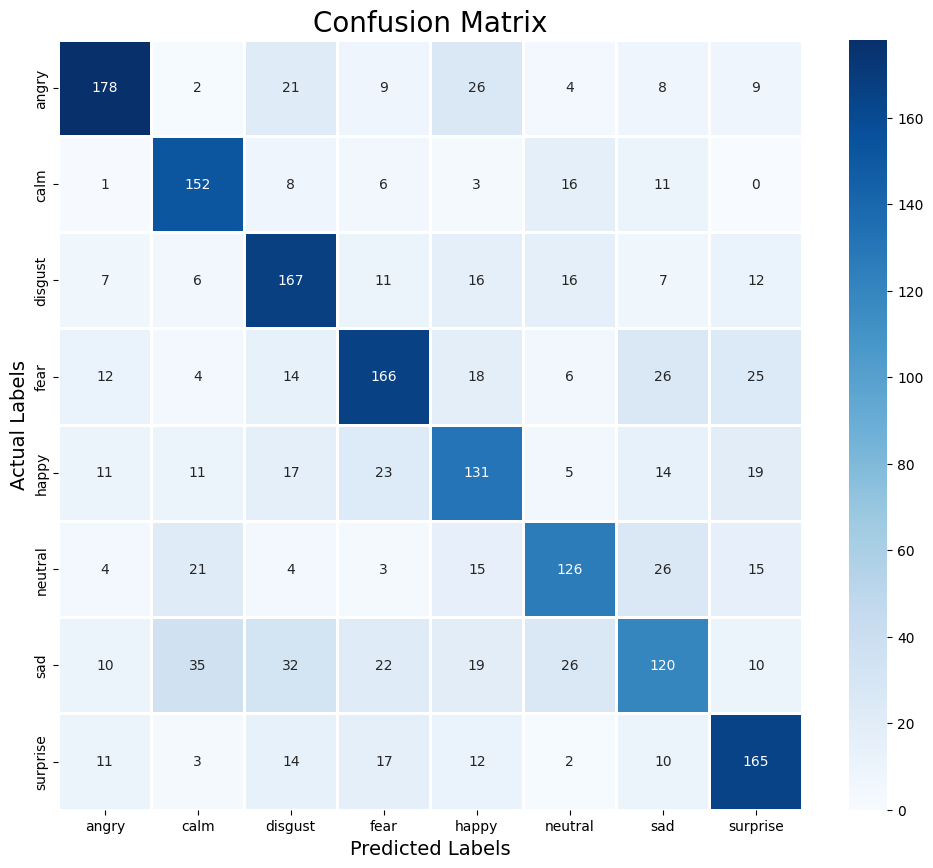


Classification_report:               precision    recall  f1-score   support

       angry       0.76      0.69      0.73       257
        calm       0.65      0.77      0.71       197
     disgust       0.60      0.69      0.64       242
        fear       0.65      0.61      0.63       271
       happy       0.55      0.57      0.56       231
     neutral       0.63      0.59      0.61       214
         sad       0.54      0.44      0.48       274
    surprise       0.65      0.71      0.67       234

    accuracy                           0.63      1920
   macro avg       0.63      0.63      0.63      1920
weighted avg       0.63      0.63      0.63      1920



In [ ]:
predicting(cnn1_model, x_test, y_test)

## CNN w/ 4 hidden layers - Accuracy: 65.63%

In [ ]:
cnn2_model=Sequential()
cnn2_model.add(Conv1D(256, kernel_size=5, strides=1, padding='same', activation='relu', input_shape=(x_train.shape[1], 1)))
cnn2_model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

cnn2_model.add(Conv1D(256, kernel_size=5, strides=1, padding='same', activation='relu'))
cnn2_model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

cnn2_model.add(Conv1D(128, kernel_size=5, strides=1, padding='same', activation='relu'))
cnn2_model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))
cnn2_model.add(Dropout(0.2))

cnn2_model.add(Conv1D(64, kernel_size=5, strides=1, padding='same', activation='relu'))
cnn2_model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

cnn2_model.add(Flatten())
cnn2_model.add(Dense(units=32, activation='relu'))
cnn2_model.add(Dropout(0.3))

cnn2_model.add(Dense(units=8, activation='softmax'))
cnn2_model.compile(optimizer = 'adam' , loss = 'categorical_crossentropy' , metrics = ['accuracy'])

cnn2_model.summary()

rlrp = ReduceLROnPlateau(monitor='loss', factor=0.4, verbose=0, patience=2, min_lr=0.0000001)
cnn2_history=cnn2_model.fit(x_train, y_train, batch_size=64, epochs=50, validation_data=(x_test, y_test), callbacks=[rlrp])

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_9 (Conv1D)           (None, 161, 256)          1536      
                                                                 
 max_pooling1d_8 (MaxPoolin  (None, 81, 256)           0         
 g1D)                                                            
                                                                 
 conv1d_10 (Conv1D)          (None, 81, 256)           327936    
                                                                 
 max_pooling1d_9 (MaxPoolin  (None, 41, 256)           0         
 g1D)                                                            
                                                                 
 conv1d_11 (Conv1D)          (None, 41, 128)           163968    
                                                                 
 max_pooling1d_10 (MaxPooli  (None, 21, 128)          

60/60 [==============================] - 5s 72ms/step - loss: 1.1869 - accuracy: 0.6562
Accuracy of our model on test data :  65.625 %


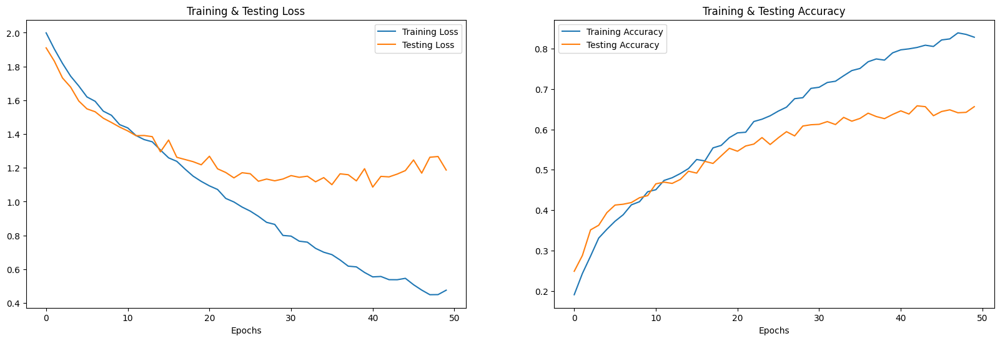

In [ ]:
accuracy_plot(cnn2_model, cnn2_history, x_test, y_test)

60/60 [==============================] - 3s 42ms/step
     Predicted Labels Actual Labels
0               angry         angry
1             neutral           sad
2                calm          calm
3               happy         happy
4                fear          fear
...               ...           ...
1915          disgust          calm
1916          disgust       disgust
1917          disgust       neutral
1918             calm          calm
1919          neutral           sad

[1920 rows x 2 columns]


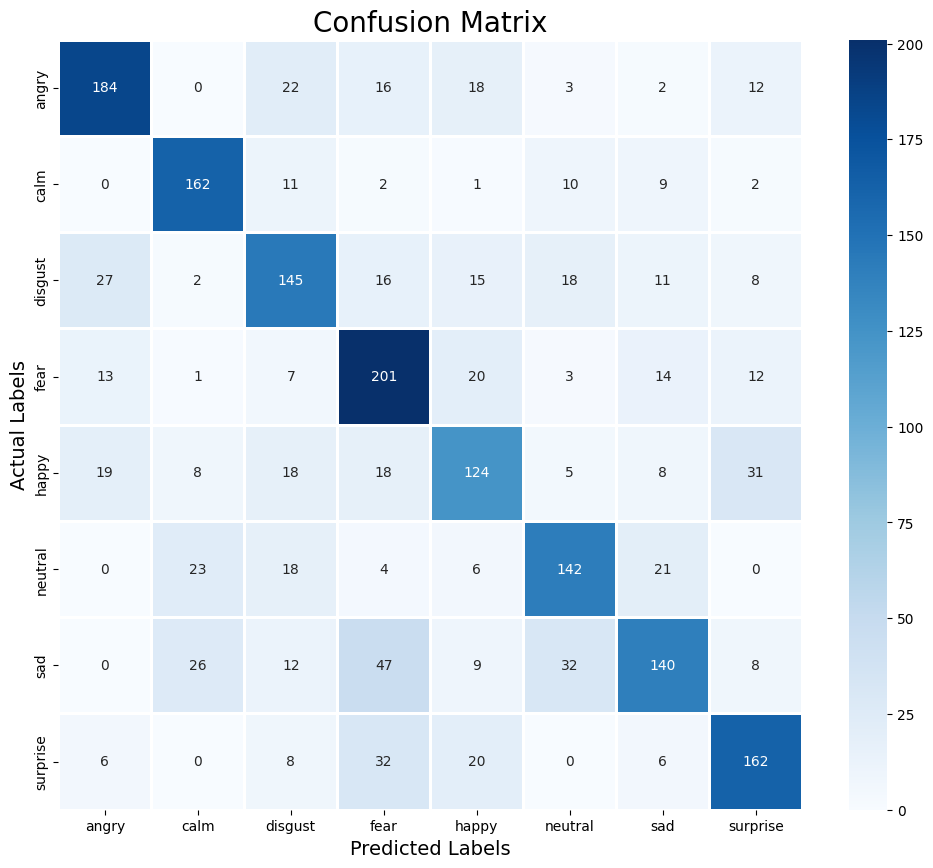


Classification_report:               precision    recall  f1-score   support

       angry       0.74      0.72      0.73       257
        calm       0.73      0.82      0.77       197
     disgust       0.60      0.60      0.60       242
        fear       0.60      0.74      0.66       271
       happy       0.58      0.54      0.56       231
     neutral       0.67      0.66      0.67       214
         sad       0.66      0.51      0.58       274
    surprise       0.69      0.69      0.69       234

    accuracy                           0.66      1920
   macro avg       0.66      0.66      0.66      1920
weighted avg       0.66      0.66      0.65      1920



In [ ]:
predicting(cnn2_model, x_test, y_test)

## CRNN - Best Accuracy: 76.51%

### Baseline Model - Accuracy 67.29%%

In [47]:
num_classes = 8
conv_filters = 64
rnn_units = 64
dropout_rate = 0.2

crnn_model = Sequential()

# Convolutional layers
crnn_model.add(Conv1D(conv_filters, 3, activation='relu', padding='same', input_shape=(x_train.shape[1], 1)))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(Conv1D(conv_filters * 2, 3, activation='relu', padding='same'))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(Conv1D(conv_filters * 4, 3, activation='relu', padding='same'))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(TimeDistributed(Flatten()))

# Recurrent layers
crnn_model.add(LSTM(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(LSTM(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(LSTM(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(LSTM(rnn_units, return_sequences=False))
crnn_model.add(Dropout(dropout_rate))

# Dense layer for output
crnn_model.add(Dense(num_classes, activation='softmax'))

# Compile the model
crnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Summary of the model
crnn_model.summary()

# Assuming x_train, y_train, x_test, y_test are properly defined and preprocessed
# and that 'rlrp' is a learning rate reduction callback defined somewhere in your code
rlrp = ReduceLROnPlateau(monitor='loss', factor=0.4, verbose=0, patience=2, min_lr=0.0000001)
crnn_history = crnn_model.fit(x_train, y_train, batch_size=64, epochs=50, validation_data=(x_test, y_test), callbacks=[rlrp])

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_20 (Conv1D)          (None, 161, 64)           256       
                                                                 
 max_pooling1d_20 (MaxPooli  (None, 80, 64)            0         
 ng1D)                                                           
                                                                 
 conv1d_21 (Conv1D)          (None, 80, 128)           24704     
                                                                 
 max_pooling1d_21 (MaxPooli  (None, 40, 128)           0         
 ng1D)                                                           
                                                                 
 conv1d_22 (Conv1D)          (None, 40, 256)           98560     
                                                                 
 max_pooling1d_22 (MaxPooli  (None, 20, 256)          

60/60 [==============================] - 4s 37ms/step - loss: 1.8141 - accuracy: 0.6729
Accuracy of our model on test data :  67.29166507720947 %


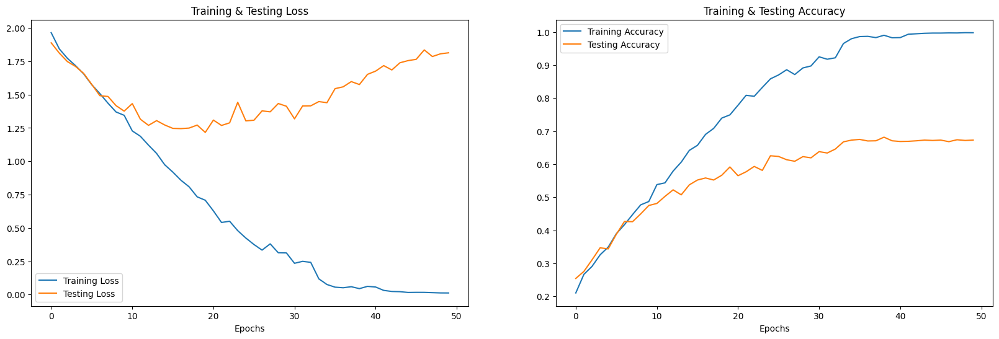

In [48]:
accuracy_plot(crnn_model, crnn_history, x_test, y_test)

60/60 [==============================] - 6s 36ms/step
     Predicted Labels Actual Labels
0               angry         angry
1             neutral           sad
2               happy          calm
3               happy         happy
4                fear          fear
...               ...           ...
1915          disgust          calm
1916          disgust       disgust
1917            happy       neutral
1918             calm          calm
1919          neutral           sad

[1920 rows x 2 columns]


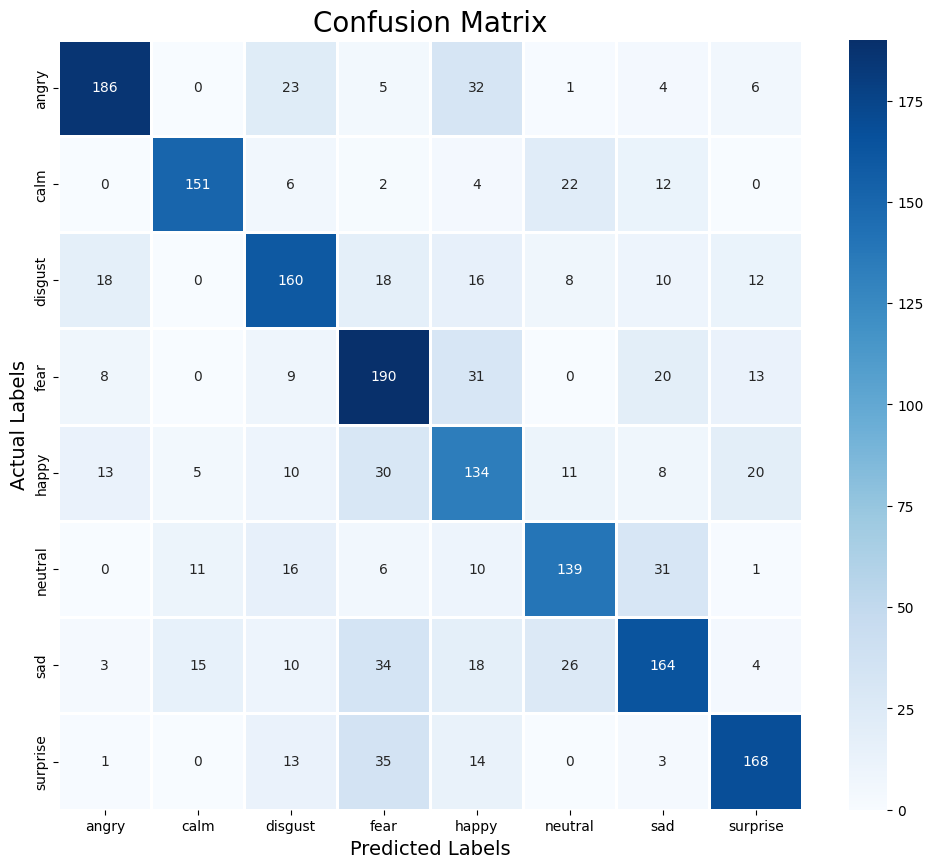


Classification_report:               precision    recall  f1-score   support

       angry       0.81      0.72      0.77       257
        calm       0.83      0.77      0.80       197
     disgust       0.65      0.66      0.65       242
        fear       0.59      0.70      0.64       271
       happy       0.52      0.58      0.55       231
     neutral       0.67      0.65      0.66       214
         sad       0.65      0.60      0.62       274
    surprise       0.75      0.72      0.73       234

    accuracy                           0.67      1920
   macro avg       0.68      0.67      0.68      1920
weighted avg       0.68      0.67      0.68      1920



In [49]:
predicting(crnn_model, x_test, y_test)


### Reducing dropout rate to 0.1 - Accuracy 67.34%

Doesn't improve baseline model significantly - Keep using dropout rate of 0.2 in other tests

In [ ]:
num_classes = 8
conv_filters = 64
rnn_units = 64
dropout_rate = 0.1

crnn_model = Sequential()

# Convolutional layers
crnn_model.add(Conv1D(conv_filters, 3, activation='relu', padding='same', input_shape=(x_train.shape[1], 1)))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(Conv1D(conv_filters * 2, 3, activation='relu', padding='same'))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(Conv1D(conv_filters * 4, 3, activation='relu', padding='same'))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(TimeDistributed(Flatten()))

# Recurrent layers
crnn_model.add(LSTM(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(LSTM(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(LSTM(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(LSTM(rnn_units, return_sequences=False))
crnn_model.add(Dropout(dropout_rate))

# Dense layer for output
crnn_model.add(Dense(num_classes, activation='softmax'))

# Compile the model
crnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Summary of the model
crnn_model.summary()

# Assuming x_train, y_train, x_test, y_test are properly defined and preprocessed
# and that 'rlrp' is a learning rate reduction callback defined somewhere in your code
rlrp = ReduceLROnPlateau(monitor='loss', factor=0.4, verbose=0, patience=2, min_lr=0.0000001)
crnn_history = crnn_model.fit(x_train, y_train, batch_size=64, epochs=50, validation_data=(x_test, y_test), callbacks=[rlrp])


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_10 (Conv1D)          (None, 161, 64)           256       
                                                                 
 max_pooling1d_10 (MaxPooli  (None, 80, 64)            0         
 ng1D)                                                           
                                                                 
 conv1d_11 (Conv1D)          (None, 80, 128)           24704     
                                                                 
 max_pooling1d_11 (MaxPooli  (None, 40, 128)           0         
 ng1D)                                                           
                                                                 
 conv1d_12 (Conv1D)          (None, 40, 256)           98560     
                                                                 
 max_pooling1d_12 (MaxPooli  (None, 20, 256)          

60/60 [==============================] - 3s 28ms/step - loss: 1.8741 - accuracy: 0.6734
Accuracy of our model on test data :  67.34374761581421 %


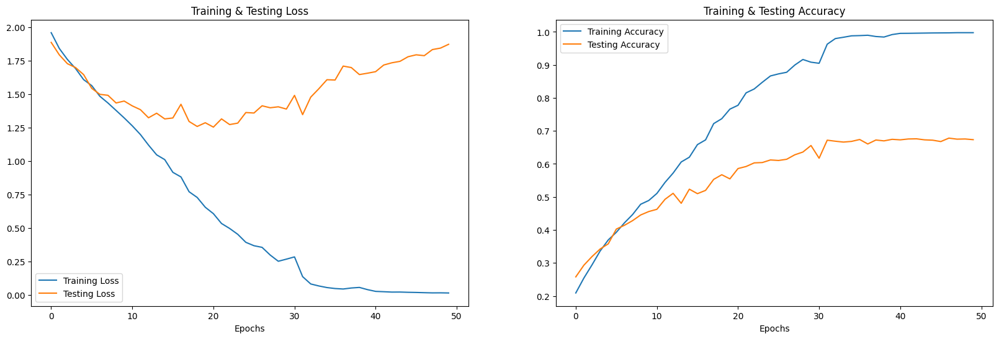

In [ ]:
accuracy_plot(crnn_model, crnn_history, x_test, y_test)

60/60 [==============================] - 5s 43ms/step
     Predicted Labels Actual Labels
0               angry         angry
1                 sad           sad
2                 sad          calm
3                fear         happy
4               happy          fear
...               ...           ...
1915          neutral          calm
1916          disgust       disgust
1917            angry       neutral
1918             calm          calm
1919              sad           sad

[1920 rows x 2 columns]


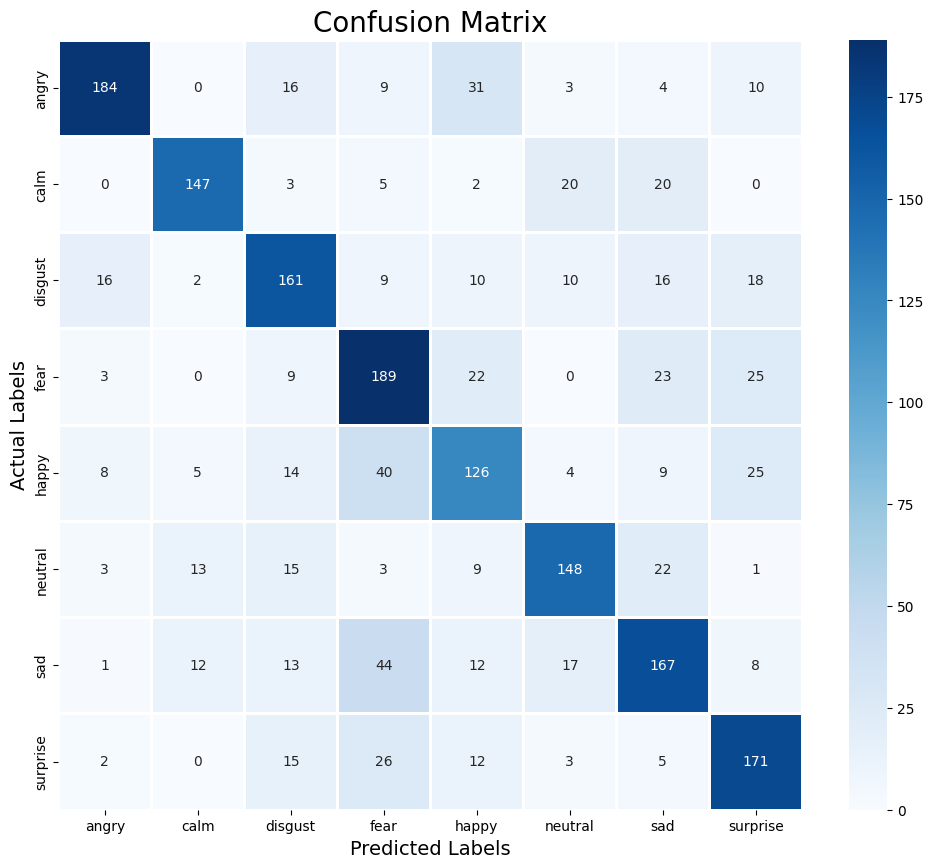


Classification_report:               precision    recall  f1-score   support

       angry       0.85      0.72      0.78       257
        calm       0.82      0.75      0.78       197
     disgust       0.65      0.67      0.66       242
        fear       0.58      0.70      0.63       271
       happy       0.56      0.55      0.55       231
     neutral       0.72      0.69      0.71       214
         sad       0.63      0.61      0.62       274
    surprise       0.66      0.73      0.70       234

    accuracy                           0.67      1920
   macro avg       0.69      0.68      0.68      1920
weighted avg       0.68      0.67      0.68      1920



In [ ]:
predicting(crnn_model, x_test, y_test)

### Changing convlutional filter size to 5 - Accuracy 70.1%

In [ ]:
num_classes = 8
conv_filters = 64
rnn_units = 64
dropout_rate = 0.2

crnn_model = Sequential()

# Convolutional layers
crnn_model.add(Conv1D(conv_filters, 5, activation='relu', padding='same', input_shape=(x_train.shape[1], 1)))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(Conv1D(conv_filters * 2, 3, activation='relu', padding='same'))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(Conv1D(conv_filters * 4, 3, activation='relu', padding='same'))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(TimeDistributed(Flatten()))

# Recurrent layers
crnn_model.add(LSTM(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(LSTM(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(LSTM(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(LSTM(rnn_units, return_sequences=False))
crnn_model.add(Dropout(dropout_rate))

# Dense layer for output
crnn_model.add(Dense(num_classes, activation='softmax'))

# Compile the model
crnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Summary of the model
crnn_model.summary()

# Assuming x_train, y_train, x_test, y_test are properly defined and preprocessed
# and that 'rlrp' is a learning rate reduction callback defined somewhere in your code
rlrp = ReduceLROnPlateau(monitor='loss', factor=0.4, verbose=0, patience=2, min_lr=0.0000001)
crnn_history = crnn_model.fit(x_train, y_train, batch_size=64, epochs=50, validation_data=(x_test, y_test), callbacks=[rlrp])



Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_13 (Conv1D)          (None, 161, 64)           384       
                                                                 
 max_pooling1d_13 (MaxPooli  (None, 80, 64)            0         
 ng1D)                                                           
                                                                 
 conv1d_14 (Conv1D)          (None, 80, 128)           24704     
                                                                 
 max_pooling1d_14 (MaxPooli  (None, 40, 128)           0         
 ng1D)                                                           
                                                                 
 conv1d_15 (Conv1D)          (None, 40, 256)           98560     
                                                                 
 max_pooling1d_15 (MaxPooli  (None, 20, 256)          

60/60 [==============================] - 10s 56ms/step - loss: 1.6538 - accuracy: 0.7010
Accuracy of our model on test data :  70.10416388511658 %


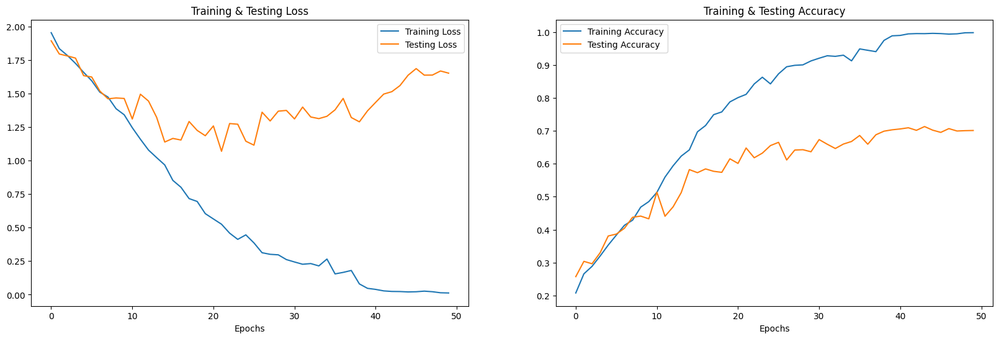

In [ ]:
accuracy_plot(crnn_model, crnn_history, x_test, y_test)

60/60 [==============================] - 8s 48ms/step
     Predicted Labels Actual Labels
0               angry         angry
1                 sad           sad
2                 sad          calm
3             disgust         happy
4                fear          fear
...               ...           ...
1915             calm          calm
1916          disgust       disgust
1917            happy       neutral
1918             calm          calm
1919          neutral           sad

[1920 rows x 2 columns]


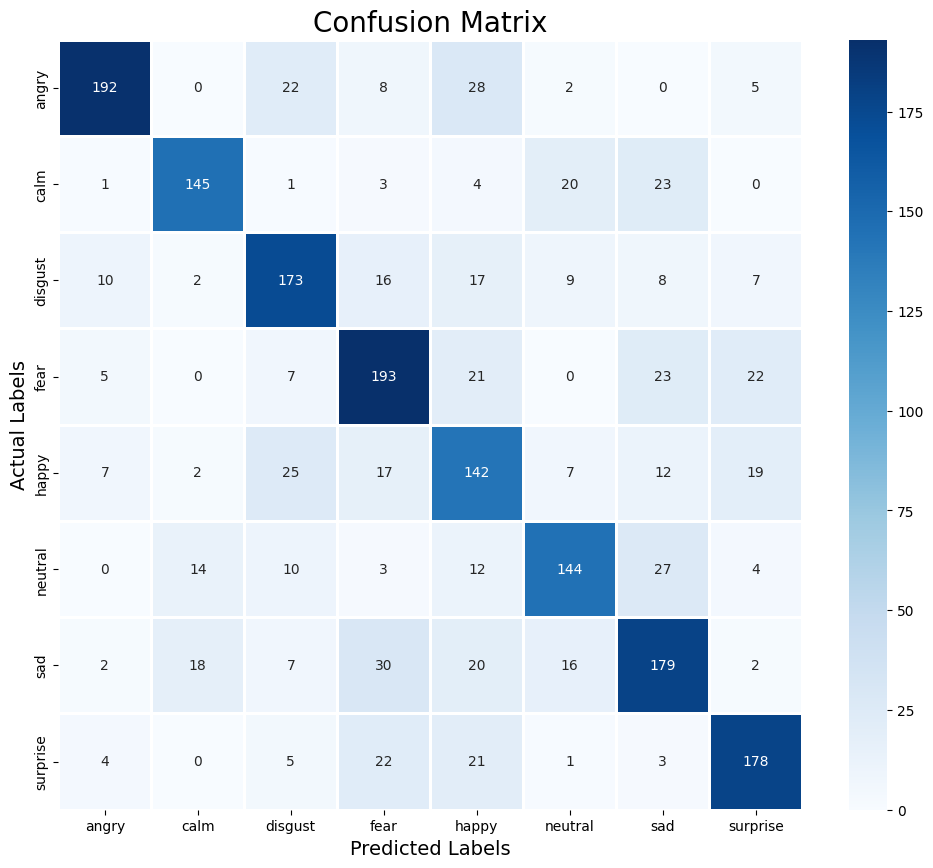


Classification_report:               precision    recall  f1-score   support

       angry       0.87      0.75      0.80       257
        calm       0.80      0.74      0.77       197
     disgust       0.69      0.71      0.70       242
        fear       0.66      0.71      0.69       271
       happy       0.54      0.61      0.57       231
     neutral       0.72      0.67      0.70       214
         sad       0.65      0.65      0.65       274
    surprise       0.75      0.76      0.76       234

    accuracy                           0.70      1920
   macro avg       0.71      0.70      0.70      1920
weighted avg       0.71      0.70      0.70      1920



In [ ]:
predicting(crnn_model, x_test, y_test)

### Adding an additional convolutional layer - Accuracy 74.43%

In [ ]:
num_classes = 8
conv_filters = 64
rnn_units = 64
dropout_rate = 0.1

crnn_model = Sequential()

# Convolutional layers
crnn_model.add(Conv1D(conv_filters, 5, activation='relu', padding='same', input_shape=(x_train.shape[1], 1)))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(Conv1D(conv_filters * 2, 3, activation='relu', padding='same'))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(Conv1D(conv_filters * 4, 3, activation='relu', padding='same'))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(Conv1D(conv_filters * 8, 3, activation ='relu', padding='same'))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(TimeDistributed(Flatten()))

# Recurrent layers
crnn_model.add(LSTM(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(LSTM(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(LSTM(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(LSTM(rnn_units, return_sequences=False))
crnn_model.add(Dropout(dropout_rate))

# Dense layer for output
crnn_model.add(Dense(num_classes, activation='softmax'))

# Compile the model
crnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Summary of the model
crnn_model.summary()

# Assuming x_train, y_train, x_test, y_test are properly defined and preprocessed
# and that 'rlrp' is a learning rate reduction callback defined somewhere in your code
rlrp = ReduceLROnPlateau(monitor='loss', factor=0.4, verbose=0, patience=2, min_lr=0.0000001)
crnn_history = crnn_model.fit(x_train, y_train, batch_size=64, epochs=50, validation_data=(x_test, y_test), callbacks=[rlrp])


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_16 (Conv1D)          (None, 161, 64)           384       
                                                                 
 max_pooling1d_16 (MaxPooli  (None, 80, 64)            0         
 ng1D)                                                           
                                                                 
 conv1d_17 (Conv1D)          (None, 80, 128)           24704     
                                                                 
 max_pooling1d_17 (MaxPooli  (None, 40, 128)           0         
 ng1D)                                                           
                                                                 
 conv1d_18 (Conv1D)          (None, 40, 256)           98560     
                                                                 
 max_pooling1d_18 (MaxPooli  (None, 20, 256)          

60/60 [==============================] - 4s 31ms/step - loss: 1.5510 - accuracy: 0.7443
Accuracy of our model on test data :  74.42708611488342 %


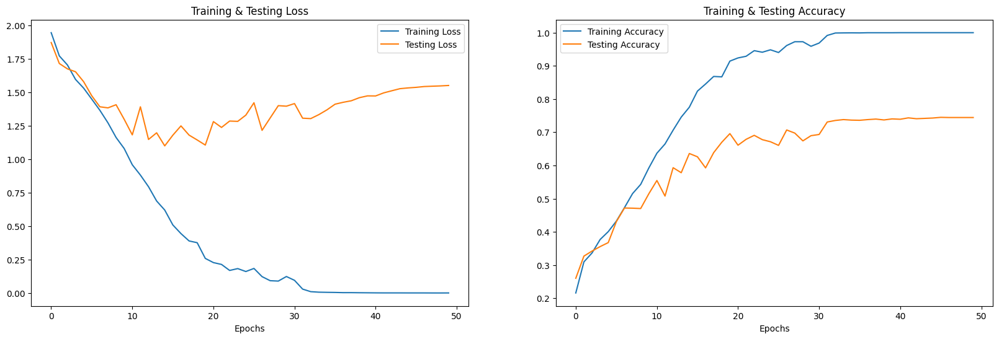

In [ ]:
accuracy_plot(crnn_model, crnn_history, x_test, y_test)

60/60 [==============================] - 3s 30ms/step
     Predicted Labels Actual Labels
0               angry         angry
1                 sad           sad
2                calm          calm
3               happy         happy
4                fear          fear
...               ...           ...
1915             calm          calm
1916          disgust       disgust
1917          neutral       neutral
1918             calm          calm
1919          neutral           sad

[1920 rows x 2 columns]


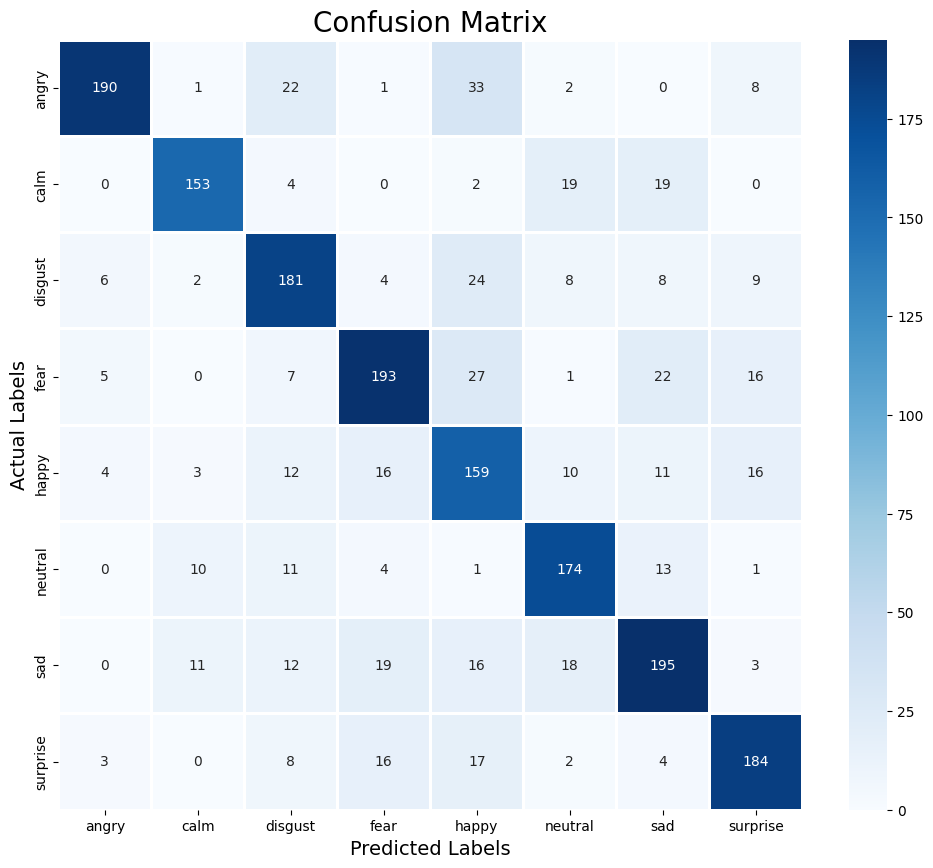


Classification_report:               precision    recall  f1-score   support

       angry       0.91      0.74      0.82       257
        calm       0.85      0.78      0.81       197
     disgust       0.70      0.75      0.73       242
        fear       0.76      0.71      0.74       271
       happy       0.57      0.69      0.62       231
     neutral       0.74      0.81      0.78       214
         sad       0.72      0.71      0.71       274
    surprise       0.78      0.79      0.78       234

    accuracy                           0.74      1920
   macro avg       0.75      0.75      0.75      1920
weighted avg       0.75      0.74      0.75      1920



In [ ]:
predicting(crnn_model, x_test, y_test)

### Trying different activation functions - Accuracy 76.2%

In [ ]:
num_classes = 8
conv_filters = 64
rnn_units = 64
dropout_rate = 0.1

crnn_model = Sequential()

# Convolutional layers
crnn_model.add(Conv1D(conv_filters, 5, activation='relu', padding='same', input_shape=(x_train.shape[1], 1)))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(Conv1D(conv_filters * 2, 3, activation='elu', padding='same'))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(Conv1D(conv_filters * 4, 3, activation='tanh', padding='same'))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(Conv1D(conv_filters * 8, 3, activation ='relu', padding='same'))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(TimeDistributed(Flatten()))

# Recurrent layers
crnn_model.add(LSTM(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(LSTM(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(LSTM(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(LSTM(rnn_units, return_sequences=False))
crnn_model.add(Dropout(dropout_rate))

# Dense layer for output
crnn_model.add(Dense(num_classes, activation='softmax'))

# Compile the model
crnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Summary of the model
crnn_model.summary()

# Assuming x_train, y_train, x_test, y_test are properly defined and preprocessed
# and that 'rlrp' is a learning rate reduction callback defined somewhere in your code
rlrp = ReduceLROnPlateau(monitor='loss', factor=0.4, verbose=0, patience=2, min_lr=0.0000001)
crnn_history = crnn_model.fit(x_train, y_train, batch_size=64, epochs=50, validation_data=(x_test, y_test), callbacks=[rlrp])


Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_32 (Conv1D)          (None, 161, 64)           384       
                                                                 
 max_pooling1d_32 (MaxPooli  (None, 80, 64)            0         
 ng1D)                                                           
                                                                 
 conv1d_33 (Conv1D)          (None, 80, 128)           24704     
                                                                 
 max_pooling1d_33 (MaxPooli  (None, 40, 128)           0         
 ng1D)                                                           
                                                                 
 conv1d_34 (Conv1D)          (None, 40, 256)           98560     
                                                                 
 max_pooling1d_34 (MaxPooli  (None, 20, 256)          

60/60 [==============================] - 4s 33ms/step - loss: 1.4223 - accuracy: 0.7620
Accuracy of our model on test data :  76.19791626930237 %


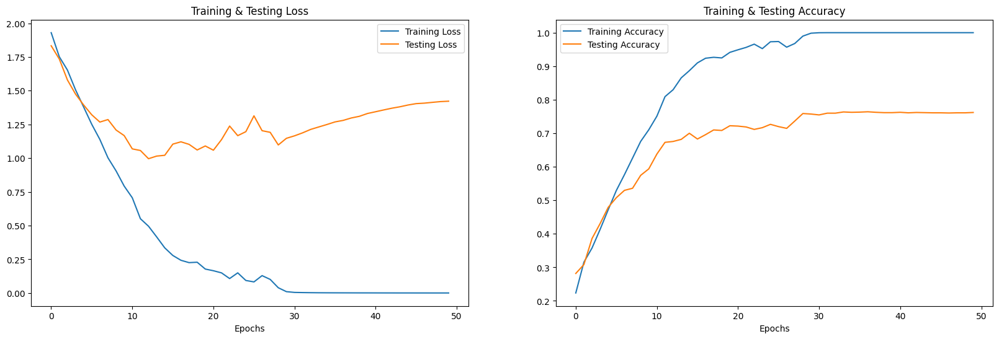

In [ ]:
accuracy_plot(crnn_model, crnn_history, x_test, y_test)

60/60 [==============================] - 4s 32ms/step
     Predicted Labels Actual Labels
0               angry         angry
1             neutral           sad
2                calm          calm
3               happy         happy
4                fear          fear
...               ...           ...
1915             calm          calm
1916          disgust       disgust
1917          neutral       neutral
1918             calm          calm
1919              sad           sad

[1920 rows x 2 columns]


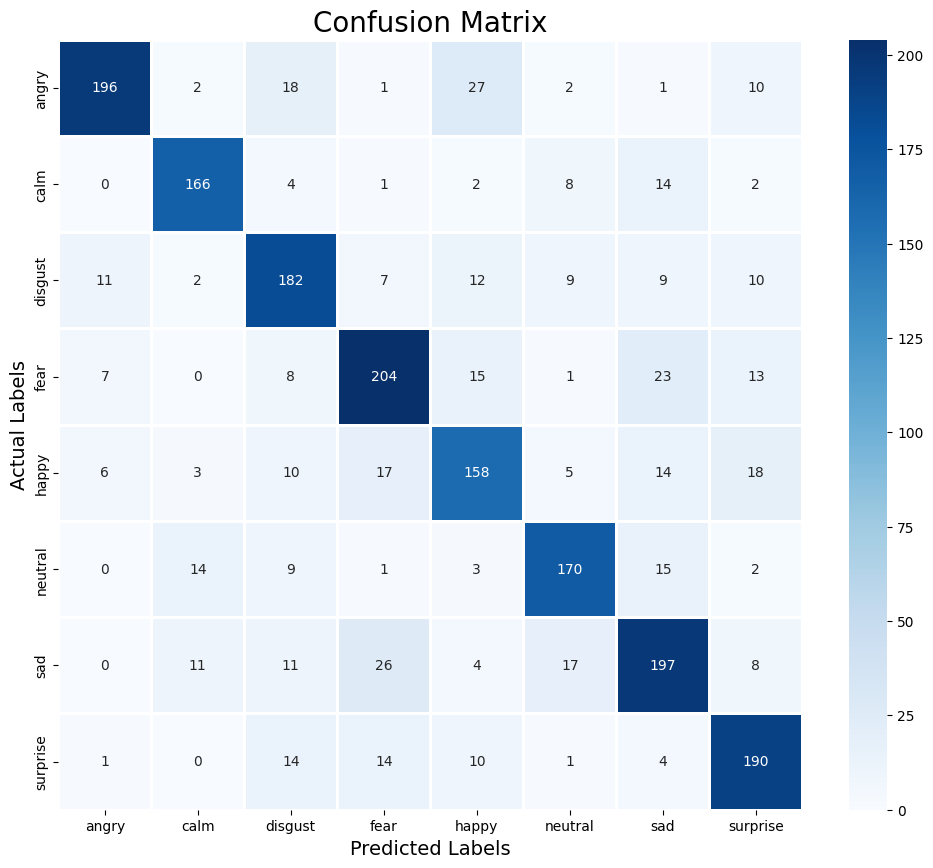


Classification_report:               precision    recall  f1-score   support

       angry       0.89      0.76      0.82       257
        calm       0.84      0.84      0.84       197
     disgust       0.71      0.75      0.73       242
        fear       0.75      0.75      0.75       271
       happy       0.68      0.68      0.68       231
     neutral       0.80      0.79      0.80       214
         sad       0.71      0.72      0.72       274
    surprise       0.75      0.81      0.78       234

    accuracy                           0.76      1920
   macro avg       0.77      0.76      0.76      1920
weighted avg       0.76      0.76      0.76      1920



In [ ]:
predicting(crnn_model, x_test, y_test)

### Trying GRU - Gated Recurrent Units - Accuracy 76.51%

In [9]:
num_classes = 8
conv_filters = 64
rnn_units = 64
dropout_rate = 0.1

crnn_model = Sequential()

# Convolutional layers
crnn_model.add(Conv1D(conv_filters, 5, activation='relu', padding='same', input_shape=(x_train.shape[1], 1)))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(Conv1D(conv_filters * 2, 3, activation='elu', padding='same'))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(Conv1D(conv_filters * 4, 3, activation='tanh', padding='same'))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(Conv1D(conv_filters * 8, 3, activation ='relu', padding='same'))
crnn_model.add(MaxPooling1D(pool_size=2))
crnn_model.add(TimeDistributed(Flatten()))

# Recurrent layers
crnn_model.add(GRU(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(GRU(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(GRU(rnn_units, return_sequences=True))
crnn_model.add(Dropout(dropout_rate))
crnn_model.add(GRU(rnn_units, return_sequences=False))
crnn_model.add(Dropout(dropout_rate))

# Dense layer for output
crnn_model.add(Dense(num_classes, activation='softmax'))

# Compile the model
crnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Summary of the model
crnn_model.summary()

# Assuming x_train, y_train, x_test, y_test are properly defined and preprocessed
# and that 'rlrp' is a learning rate reduction callback defined somewhere in your code
rlrp = ReduceLROnPlateau(monitor='loss', factor=0.4, verbose=0, patience=2, min_lr=0.0000001)
crnn_history = crnn_model.fit(x_train, y_train, batch_size=64, epochs=50, validation_data=(x_test, y_test), callbacks=[rlrp])


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 161, 64)           384       
                                                                 
 max_pooling1d (MaxPooling1  (None, 80, 64)            0         
 D)                                                              
                                                                 
 conv1d_1 (Conv1D)           (None, 80, 128)           24704     
                                                                 
 max_pooling1d_1 (MaxPoolin  (None, 40, 128)           0         
 g1D)                                                            
                                                                 
 conv1d_2 (Conv1D)           (None, 40, 256)           98560     
                                                                 
 max_pooling1d_2 (MaxPoolin  (None, 20, 256)           0

60/60 [==============================] - 3s 28ms/step - loss: 1.3112 - accuracy: 0.7651
Accuracy of our model on test data :  76.51041746139526 %


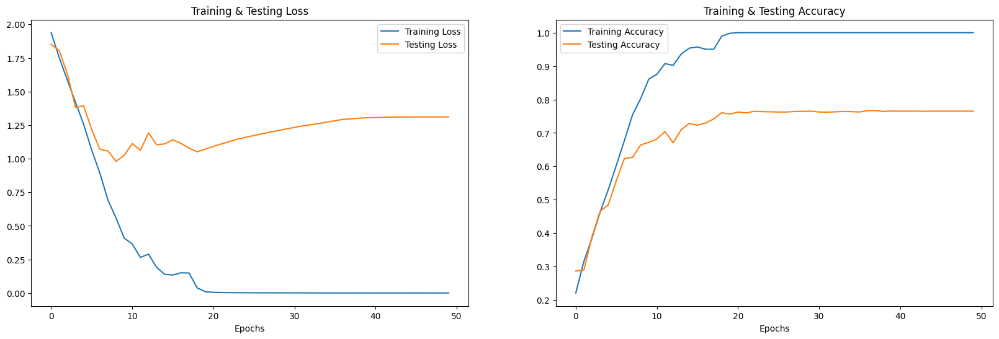

In [10]:
accuracy_plot(crnn_model, crnn_history, x_test, y_test)

60/60 [==============================] - 3s 28ms/step
     Predicted Labels Actual Labels
0               angry         angry
1                 sad           sad
2                 sad          calm
3               angry         happy
4                fear          fear
...               ...           ...
1915             calm          calm
1916          disgust       disgust
1917          neutral       neutral
1918             calm          calm
1919              sad           sad

[1920 rows x 2 columns]


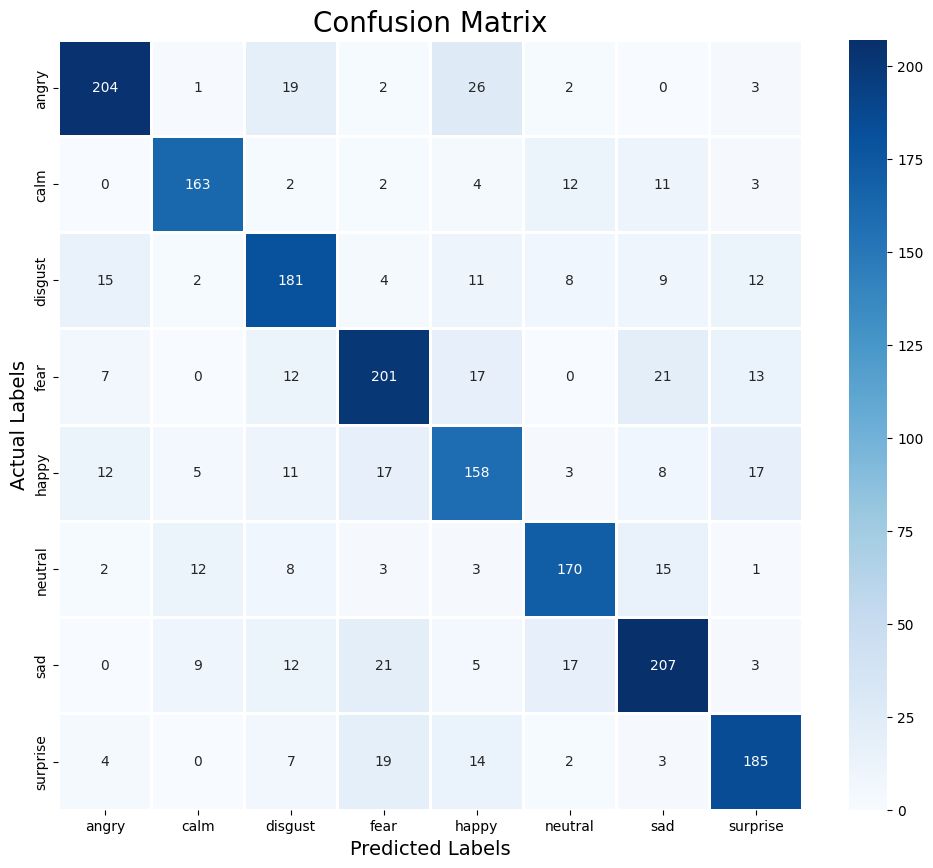


Classification_report:               precision    recall  f1-score   support

       angry       0.84      0.79      0.81       257
        calm       0.85      0.83      0.84       197
     disgust       0.72      0.75      0.73       242
        fear       0.75      0.74      0.74       271
       happy       0.66      0.68      0.67       231
     neutral       0.79      0.79      0.79       214
         sad       0.76      0.76      0.76       274
    surprise       0.78      0.79      0.79       234

    accuracy                           0.77      1920
   macro avg       0.77      0.77      0.77      1920
weighted avg       0.77      0.77      0.77      1920



In [11]:
predicting(crnn_model, x_test, y_test)

# Testing on Best Model

Testing audio clips from Pixar's [Inside Out](https://www.youtube.com/watch?v=1HFv47QHWJU&t=120s) (2015) trailer, 3 of each emotion

## Loading test data and preparing test data

In [63]:
Test = '/content/drive/MyDrive/DS340Project/TEST/'

#os.getcwd()            # Check current directory
os.chdir(Test)       # Access new directory
#os.listdir(Ravdess)    # List current directory contents

test_directory_list = os.listdir(Test)

file_emotion = []
file_path = []

for file in test_directory_list:
    file_path.append(Test + file)
    part = file.split('_')[1]
    ele = part[:2]
    if ele=='an':
        file_emotion.append('angry')
    elif ele=='ca':
        file_emotion.append('calm')
    elif ele=='di':
        file_emotion.append('disgust')
    elif ele=='fe':
        file_emotion.append('fear')
    elif ele=='ha':
        file_emotion.append('happy')
    elif ele=='ne':
        file_emotion.append('neutral')
    elif ele=='sa':
        file_emotion.append('sad')
    else:
        file_emotion.append('surprise')

# dataframe for emotion of files
emotion_df = pd.DataFrame(file_emotion, columns=['Emotions'])

# dataframe for path of files.
path_df = pd.DataFrame(file_path, columns=['Path'])
test1 = pd.concat([emotion_df, path_df], axis=1)
test1

,Emotions,Path
0,calm,/content/drive/MyDrive/DS340Project/TEST/mom_c...
1,angry,/content/drive/MyDrive/DS340Project/TEST/dad_a...
2,angry,/content/drive/MyDrive/DS340Project/TEST/dad_a...
3,happy,/content/drive/MyDrive/DS340Project/TEST/joy_h...
4,happy,/content/drive/MyDrive/DS340Project/TEST/joy_h...
5,happy,/content/drive/MyDrive/DS340Project/TEST/joy_h...
6,sad,/content/drive/MyDrive/DS340Project/TEST/sadne...
7,surprise,/content/drive/MyDrive/DS340Project/TEST/joy_s...
8,surprise,/content/drive/MyDrive/DS340Project/TEST/fear_...
9,fear,/content/drive/MyDrive/DS340Project/TEST/fear_...


In [64]:
# Running data augmentation and feature extraction functions from above

X1, Y1 = [], []
for path, emotion in tqdm(zip(test1.Path, test1.Emotions), total=len(test1.Path)):
    feature = get_features(path)
    for ele in feature:
        X1.append(ele)
        # appending emotion 4 times as we have made 4 augmentation techniques on each audio file.
        Y1.append(emotion)

print(len(X1), len(Y1), test1.Path.shape)

test_features = pd.DataFrame(X1)
test_features['labels'] = Y1
test_features.head()

100%|██████████| 24/24 [00:04<00:00,  4.98it/s]


96 96 (24,)


,0,1,2,3,4,5,6,7,8,9,...,153,154,155,156,157,158,159,160,161,labels
0,0.082750,0.855182,0.729087,0.551252,0.499197,0.698058,0.526339,0.548500,0.802493,0.652733,...,0.006125,0.011824,0.008116,0.004288,0.003443,0.002820,0.003061,0.001474,0.000077,calm
1,0.106269,0.861977,0.737360,0.580375,0.540656,0.724902,0.543678,0.565722,0.803656,0.662683,...,0.010191,0.015302,0.012979,0.009680,0.008540,0.008048,0.008407,0.006409,0.004863,calm
2,0.087757,0.766292,0.785786,0.591872,0.501629,0.692211,0.592367,0.523687,0.799524,0.717190,...,0.003290,0.006293,0.003868,0.002204,0.001740,0.001436,0.001506,0.000686,0.000037,calm
3,0.117282,0.499856,0.515588,0.774156,0.618490,0.500823,0.564001,0.541471,0.795169,0.710410,...,0.006547,0.007611,0.002798,0.002653,0.002386,0.004872,0.002889,0.002066,0.000103,calm
4,0.216213,0.658377,0.644938,0.740259,0.736372,0.720638,0.722631,0.667470,0.770890,0.815241,...,0.252473,0.210378,0.169594,0.337213,0.236055,0.132906,0.113759,0.059272,0.003010,angry


In [65]:
# Getting X and Y

X1 = test_features.iloc[: ,:-1].values
Y1 = test_features['labels'].values

print(X1.shape, Y1.shape)
print(X1,Y1)

# Resizing

# As this is a multiclass classification problem onehotencoding our Y.
encoder = OneHotEncoder()
Y1 = encoder.fit_transform(np.array(Y1).reshape(-1,1)).toarray()
print(X1.shape, Y1.shape)
print()

# scaling our data with sklearn's Standard scaler
scaler = StandardScaler()
X1 = scaler.fit_transform(X1)
print(X1.shape, Y1.shape)
#x_train, y_train, x_test, y_test
print()

# making our data compatible to model.
X1 = np.expand_dims(X1, axis=2)
print(X1.shape, Y1.shape)

(96, 162) (96,)
[[8.27501085e-02 8.55181575e-01 7.29086995e-01 ... 3.06059141e-03
  1.47388643e-03 7.74270375e-05]
 [1.06268989e-01 8.61977378e-01 7.37360077e-01 ... 8.40681490e-03
  6.40930485e-03 4.86284002e-03]
 [8.77574574e-02 7.66292214e-01 7.85786211e-01 ... 1.50611880e-03
  6.85988984e-04 3.71626957e-05]
 ...
 [1.97383996e-01 7.01661088e-01 7.41215786e-01 ... 1.71025747e-01
  9.29702942e-02 3.11952131e-02]
 [2.03196456e-01 7.01917171e-01 7.51216769e-01 ... 7.87484050e-02
  2.97196135e-02 2.42624921e-03]
 [2.31785630e-01 7.55747855e-01 7.37263143e-01 ... 7.00486526e-02
  4.46409993e-02 5.82967792e-03]] ['calm' 'calm' 'calm' 'calm' 'angry' 'angry' 'angry' 'angry' 'angry'
 'angry' 'angry' 'angry' 'happy' 'happy' 'happy' 'happy' 'happy' 'happy'
 'happy' 'happy' 'happy' 'happy' 'happy' 'happy' 'sad' 'sad' 'sad' 'sad'
 'surprise' 'surprise' 'surprise' 'surprise' 'surprise' 'surprise'
 'surprise' 'surprise' 'fear' 'fear' 'fear' 'fear' 'disgust' 'disgust'
 'disgust' 'disgust' 'sad' 'sad

## Predicting test data on best model and evaluating accuracy

3/3 [==============================] - 0s 46ms/step
96 96 96


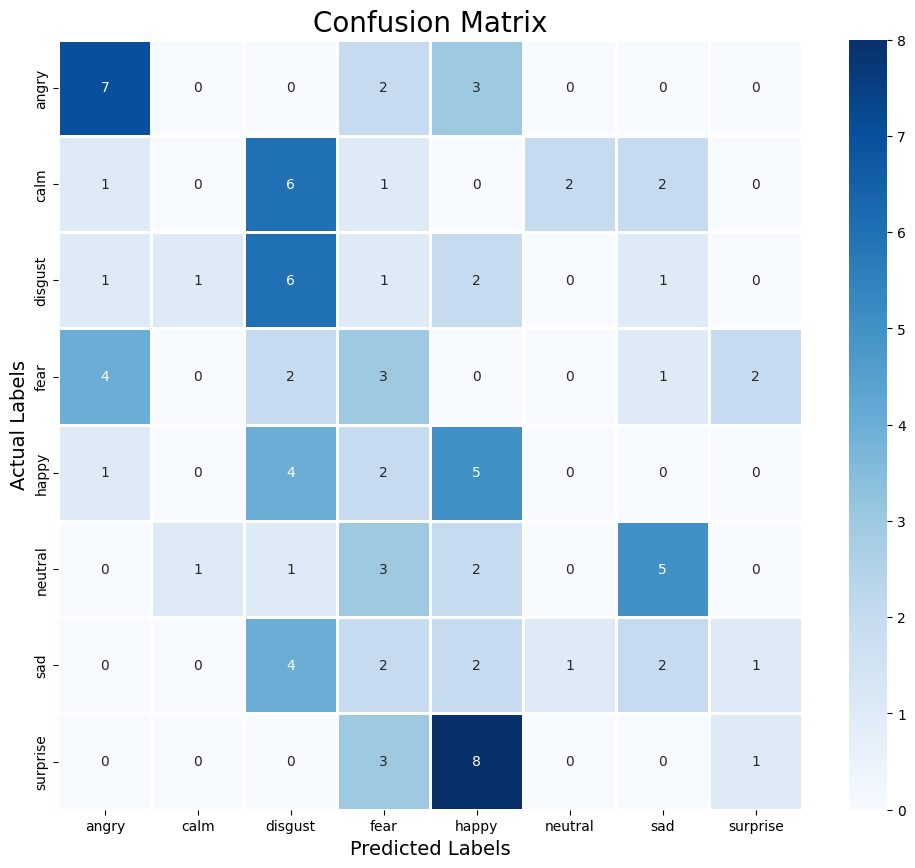

,Predicted Labels,Actual Labels,Path
0,neutral,calm,/content/drive/MyDrive/DS340Project/TEST/mom_c...
1,sad,calm,/content/drive/MyDrive/DS340Project/TEST/mom_c...
2,neutral,calm,/content/drive/MyDrive/DS340Project/TEST/mom_c...
3,sad,calm,/content/drive/MyDrive/DS340Project/TEST/mom_c...
4,fear,angry,/content/drive/MyDrive/DS340Project/TEST/dad_a...
5,happy,angry,/content/drive/MyDrive/DS340Project/TEST/dad_a...
6,fear,angry,/content/drive/MyDrive/DS340Project/TEST/dad_a...
7,angry,angry,/content/drive/MyDrive/DS340Project/TEST/dad_a...
8,angry,angry,/content/drive/MyDrive/DS340Project/TEST/dad_a...
9,angry,angry,/content/drive/MyDrive/DS340Project/TEST/dad_a...


In [69]:
# Predicting on Test Data
def predicting_test(model, x_test, y_test):

  # Making New Predictions
  pred_test = model.predict(x_test)
  y_pred = encoder.inverse_transform(pred_test)
  y_test = encoder.inverse_transform(y_test)
  print(len(pred_test),len(y_pred),len(y_test))

  df = pd.DataFrame(columns=['Predicted Labels', 'Actual Labels'])
  df['Predicted Labels'] = y_pred.flatten()
  df['Actual Labels'] = y_test.flatten()


  # Confusion Matrix
  cm = confusion_matrix(y_test, y_pred)
  plt.figure(figsize = (12, 10))
  cm = pd.DataFrame(cm , index = [i for i in encoder.categories_] , columns = [i for i in encoder.categories_])
  sns.heatmap(cm, linecolor='white', cmap='Blues', linewidth=1, annot=True, fmt='')
  plt.title('Confusion Matrix', size=20)
  plt.xlabel('Predicted Labels', size=14)
  plt.ylabel('Actual Labels', size=14)
  plt.show()

  return df

pd.set_option('display.max_rows',None)
predictions = predicting_test(crnn_model, X1, Y1)

paths_all = []
for i in test1.Path:
  for j in range(4):
    paths_all.append(i)

predictions['Path'] = paths_all
predictions # there are 4x predictions than the test data because 3 different augmentations were done

In [67]:
# Accuracy

correct = 0

for i in range(len(predictions)):
  if predictions['Predicted Labels'][i] == predictions['Actual Labels'][i]:
    correct += 1

print("Accuracy:", correct/len(predictions))

# Examining the predictions, we see that the model does better with strong emotions (angry, disgust, sad)
# Milder emotions don't perform as well (happy, calm, neutral, surprise, fear)

strong = 0
strong_correct = 0

weak = 0
weak_correct = 0

for i in range(len(predictions)):
  if predictions['Actual Labels'][i] in ['angry', 'disgust', 'sad']:                          # Stronger emotions
    strong += 1
    if predictions['Predicted Labels'][i] == predictions['Actual Labels'][i]:
      strong_correct += 1

  elif predictions['Actual Labels'][i] in ['happy', 'calm', 'neutral', 'surprise', 'fear']:    # Milder emotions or similar expressions
    weak += 1
    if predictions['Predicted Labels'][i] == predictions['Actual Labels'][i]:
      weak_correct += 1

print("Accuracy of strong emotions:", strong_correct/strong)
print("Accuracy of weak emotions:", weak_correct/weak)

Accuracy: 0.25
Accuracy of strong emotions: 0.4166666666666667
Accuracy of weak emotions: 0.15
